# PACKAGES AND LIBRARIES

In [9]:
#GENERAL
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import random
import time
#PATH PROCESS
import os
import os.path
from pathlib import Path
import glob
from scipy.io import loadmat
import nibabel as nib
import csv
#IMAGE PROCESS
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras.preprocessing import image
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from scipy.ndimage.filters import convolve
from skimage import data, io, filters
import skimage
from skimage.morphology import convex_hull_image, erosion
from IPython import display
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.patches as patches
#SCALER & TRANSFORMATION
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder
#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
#OPTIMIZER
from keras.optimizers import RMSprop,Adam,Optimizer,Optimizer, SGD
#MODEL LAYERS
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN,\
LSTM, GlobalAveragePooling2D, SeparableConv2D, ZeroPadding2D, Convolution2D, ZeroPadding2D,Reshape, Conv2DTranspose,\
LeakyReLU, GaussianNoise, GlobalMaxPooling2D, ReLU, Input, Concatenate
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
from keras.utils import plot_model
from keras.datasets import mnist
import keras
from keras.models import Model
#IGNORING WARNINGS
from warnings import filterwarnings
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

C:\Users\Adwait\AppData\Local\Temp\ipykernel_28008\2458803103.py:25: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve


In [8]:
pip install nibabel

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 3.3/3.3 MB 5.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


# OBSERVATION SET AND OVERVIEW

#### MAIN PATH

In [81]:
Label_Path = Path("C:/Users/Adwait/Desktop/Nanavati dataset/01/masks")
Image_Path = Path("C:/Users/Adwait/Desktop/Nanavati dataset/01/images")

#### JPG PATH

In [3]:
Label_Path = list(Label_Path.glob(r"**/*.jpg"))
Image_Path = list(Image_Path.glob(r"**/*.jpg"))

In [4]:
print("LABEL LEN:",len(Label_Path))
print("---"*10)
print("IMAGE LEN:",len(Image_Path))

LABEL LEN: 553
------------------------------
IMAGE LEN: 276


#### TO SERIES

In [5]:
Label_Series = pd.Series(Label_Path,name="LABEL").astype(str)
Image_Series = pd.Series(Image_Path,name="IMAGE").astype(str)

In [6]:
print("LABEL LEN:",len(Label_Series))
print("---"*10)
print("IMAGE LEN:",len(Image_Series))

LABEL LEN: 553
------------------------------
IMAGE LEN: 276


In [7]:
print("LABEL TYPE:",type(Label_Series))
print("---"*10)
print("IMAGE TYPE:",type(Image_Series))

LABEL TYPE: <class 'pandas.core.series.Series'>
------------------------------
IMAGE TYPE: <class 'pandas.core.series.Series'>


In [8]:
print("LABEL PATH EXAMPLE:\n",Label_Series[0])
print("LABEL PATH EXAMPLE:\n",Label_Series[276])
print("---"*10)
print("IMAGE PATH EXAMPLE:\n",Image_Series[0])

LABEL PATH EXAMPLE:
 C:\Users\Adwait\Desktop\Nanavati dataset\01\masks\masks_L\image_0.jpg
LABEL PATH EXAMPLE:
 C:\Users\Adwait\Desktop\Nanavati dataset\01\masks\masks_L\image_99.jpg
------------------------------
IMAGE PATH EXAMPLE:
 C:\Users\Adwait\Desktop\Nanavati dataset\01\images\image_0.jpg


In [9]:
import re
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [ convert(c) for c in re.split('([0-9]+)', key) ] 
    return sorted(data, key=alphanum_key)

In [60]:
Label_Series=sorted_alphanumeric(Label_Series)
Left_Label_Series=Label_Series[0:len(Image_Path)+1]
Right_Label_Series=Label_Series[len(Image_Path)+1:]
Image_Series=sorted_alphanumeric(Image_Series)

In [62]:
Left_Label_Series

['C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_0.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_1.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_2.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_3.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_4.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_5.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_6.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_7.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_8.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_9.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_10.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_11.jpg',
 'C:\\Users\\A

#### CHECKING FOR NO HIPPOCAMPUS OR HIPPOCAMPUS

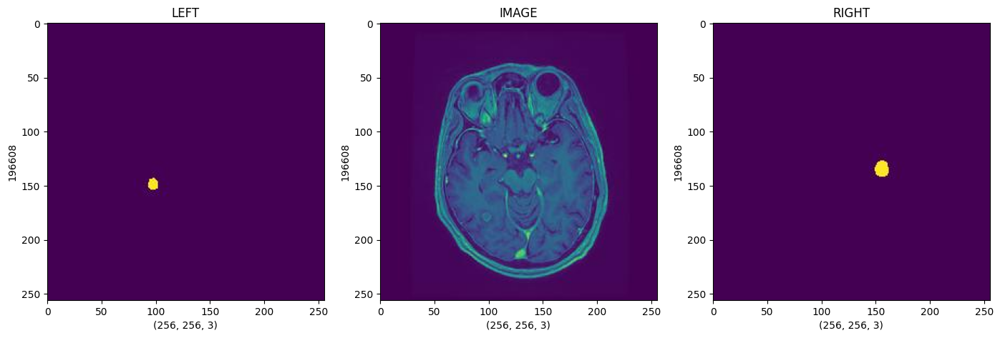

In [11]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[113]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

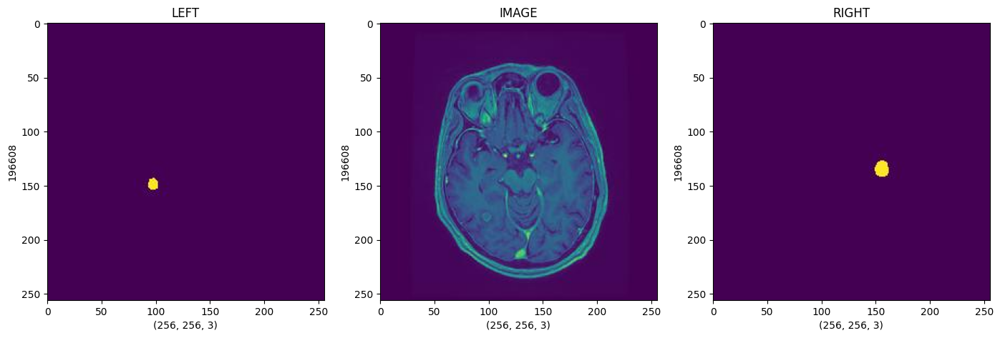

In [12]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[113]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

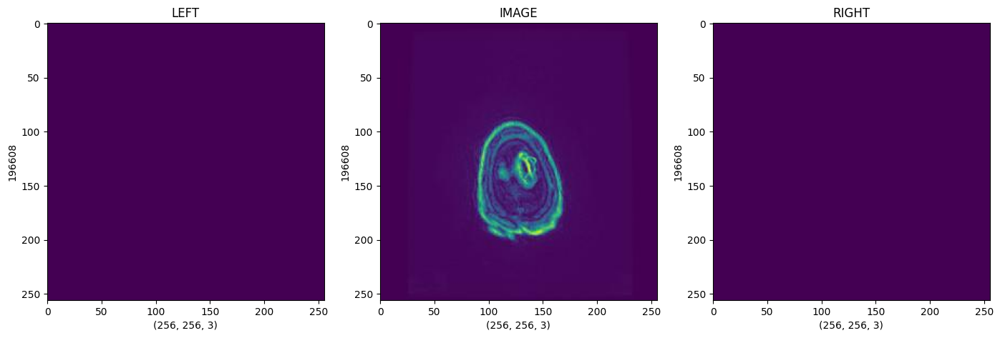

In [13]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[240]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[240]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[240]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

In [14]:
Image_Series

['C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_0.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_1.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_2.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_3.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_4.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_5.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_6.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_7.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_8.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_9.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_10.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_11.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\images\\image_12.jpg',
 'C:\\Users\\Adwait\\Desktop\\Nanav

#### HIPPOCAMPUS CONCAT

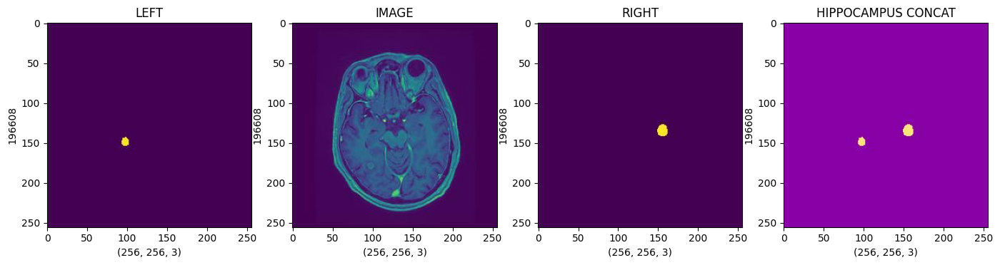

In [15]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[113]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Hıppocampus_Concat.shape)
axis[3].set_ylabel(Hıppocampus_Concat.size)
axis[3].set_title("HIPPOCAMPUS CONCAT")
axis[3].imshow(Hıppocampus_Concat)

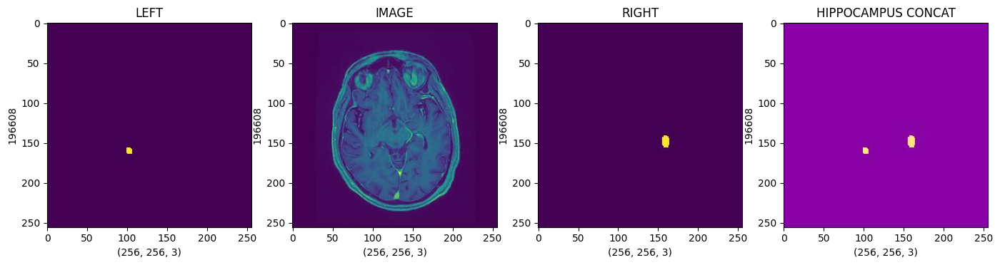

In [16]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[123]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[123]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[123]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
cv2.imwrite("face.jpg", Hıppocampus_Concat)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Hıppocampus_Concat.shape)
axis[3].set_ylabel(Hıppocampus_Concat.size)
axis[3].set_title("HIPPOCAMPUS CONCAT")
axis[3].imshow(Hıppocampus_Concat)

# IMAGE AND HIPPOCAMPUS CONCAT

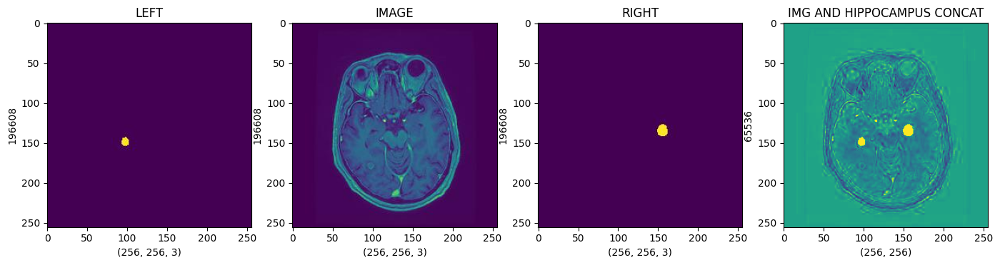

In [17]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[113]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Main_Concat = cv2.addWeighted(Example_IMG[:,:,0],1,Hıppocampus_Concat[:,:,0],1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Main_Concat.shape)
axis[3].set_ylabel(Main_Concat.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Main_Concat)

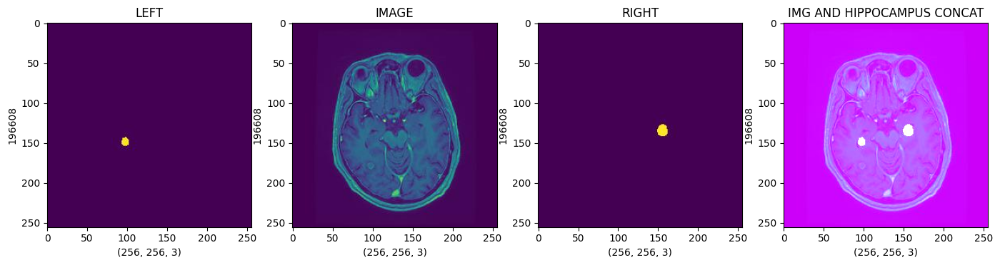

In [18]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[113]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Main_Concat = cv2.addWeighted(Example_IMG,1,Hıppocampus_Concat,1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Main_Concat.shape)
axis[3].set_ylabel(Main_Concat.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Main_Concat)

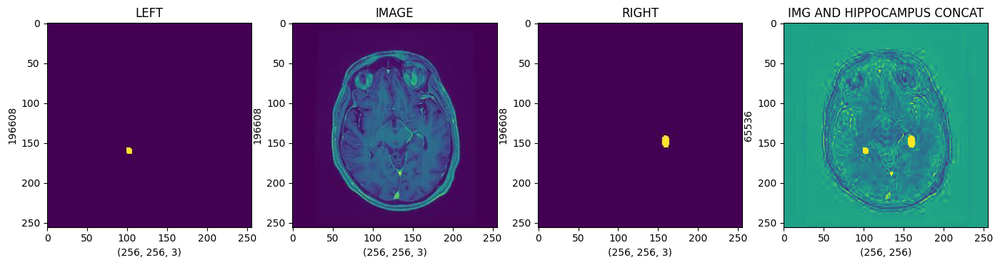

In [19]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[123]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[123]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[123]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Main_Concat = cv2.addWeighted(Example_IMG[:,:,0],1,Hıppocampus_Concat[:,:,0],1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Main_Concat.shape)
axis[3].set_ylabel(Main_Concat.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Main_Concat)

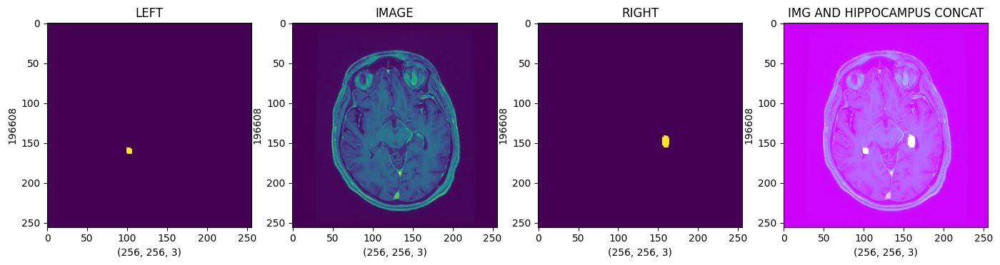

In [20]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[123]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[123]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[123]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Main_Concat = cv2.addWeighted(Example_IMG,1,Hıppocampus_Concat,1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Main_Concat.shape)
axis[3].set_ylabel(Main_Concat.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Main_Concat)

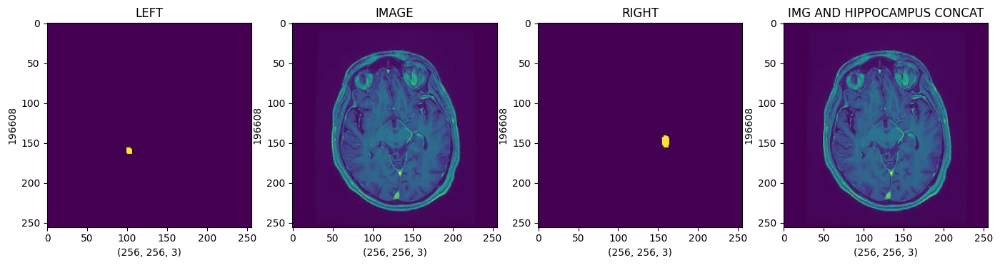

In [21]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[123]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[123]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[123]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus_Concat[:,:,0] == 1] = [255,0,0]
Copy_Main[Hıppocampus_Concat[:,:,0] == 2] = [0,255,0]
    
Copy_Main_Two = Example_IMG.copy()
Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)


axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Blend_Image.shape)
axis[3].set_ylabel(Blend_Image.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Blend_Image)

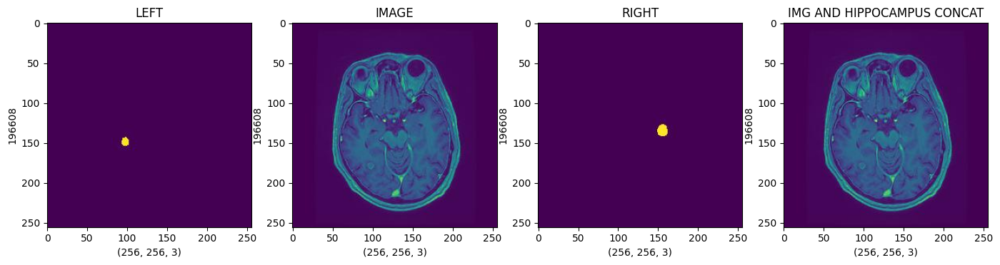

In [22]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[113]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus_Concat[:,:,0] == 1] = [255,0,0]
Copy_Main[Hıppocampus_Concat[:,:,0] == 2] = [0,255,255]
    
Copy_Main_Two = Example_IMG.copy()
Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)


axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Blend_Image.shape)
axis[3].set_ylabel(Blend_Image.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Blend_Image)

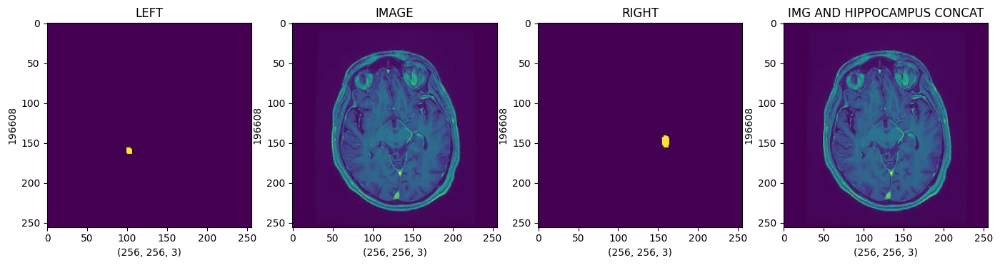

In [23]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[123]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[123]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[123]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus_Concat[:,:,0] == 1] = [255,0,0]
    
Copy_Main_Two = Example_IMG.copy()
Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)


axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Blend_Image.shape)
axis[3].set_ylabel(Blend_Image.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Blend_Image)

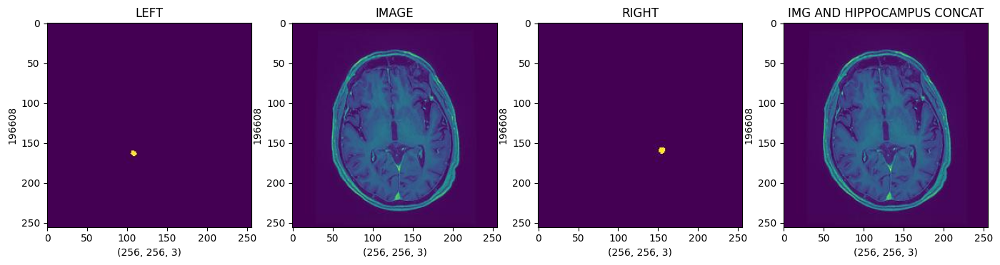

In [24]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[133]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[133]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[133]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus_Concat[:,:,0] == 1] = [255,0,0]
    
Copy_Main_Two = Example_IMG.copy()
Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)


axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Blend_Image.shape)
axis[3].set_ylabel(Blend_Image.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Blend_Image)

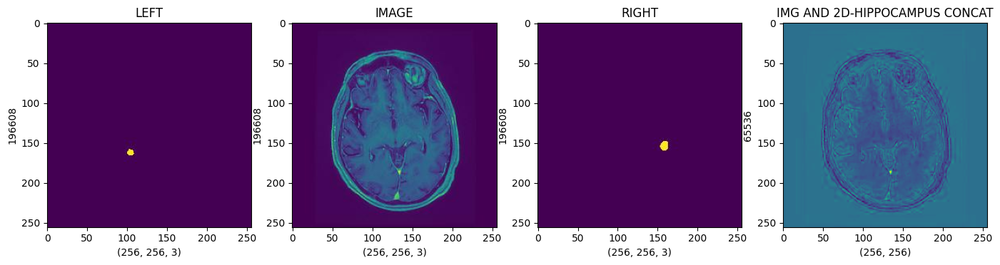

In [25]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[126]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[126]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[126]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus_Concat[:,:,0] == 1] = [255,0,0]
    
Copy_Main_Two = Example_IMG.copy()
Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)


axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Blend_Image[:,:,0].shape)
axis[3].set_ylabel(Blend_Image[:,:,0].size)
axis[3].set_title("IMG AND 2D-HIPPOCAMPUS CONCAT")
axis[3].imshow(Blend_Image[:,:,0])

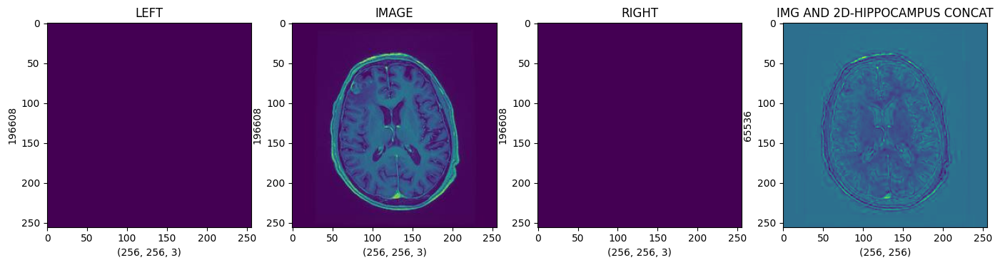

In [26]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[153]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[153]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[153]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus_Concat[:,:,0] == 1] = [255,0,0]
    
Copy_Main_Two = Example_IMG.copy()
Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)


axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Blend_Image[:,:,0].shape)
axis[3].set_ylabel(Blend_Image[:,:,0].size)
axis[3].set_title("IMG AND 2D-HIPPOCAMPUS CONCAT")
axis[3].imshow(Blend_Image[:,:,0])

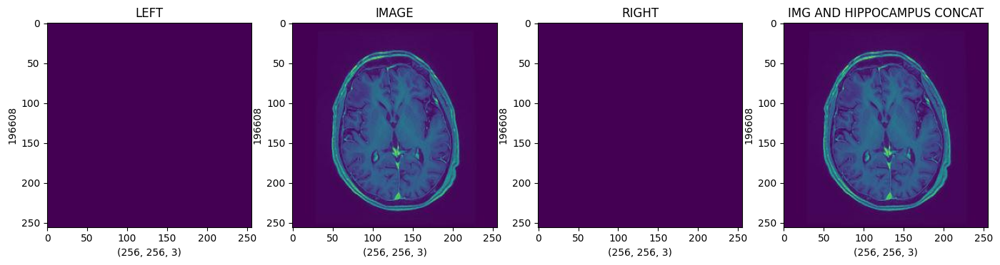

In [260]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[140]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[140]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[140]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus_Concat[:,:,0] == 1] = [255,0,0]
    
Copy_Main_Two = Example_IMG.copy()
Blend_Image = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)


axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Blend_Image.shape)
axis[3].set_ylabel(Blend_Image.size)
axis[3].set_title("IMG AND HIPPOCAMPUS CONCAT")
axis[3].imshow(Blend_Image)

#### THRESHOLD-CANNY-DRAWING

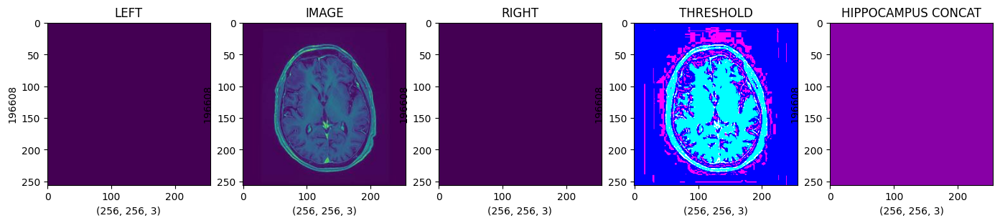

In [261]:
figure,axis = plt.subplots(1,5,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[140]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[140]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[140]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Hıppocampus_Concat.shape)
axis[4].set_ylabel(Hıppocampus_Concat.size)
axis[4].set_title("HIPPOCAMPUS CONCAT")
axis[4].imshow(Hıppocampus_Concat)

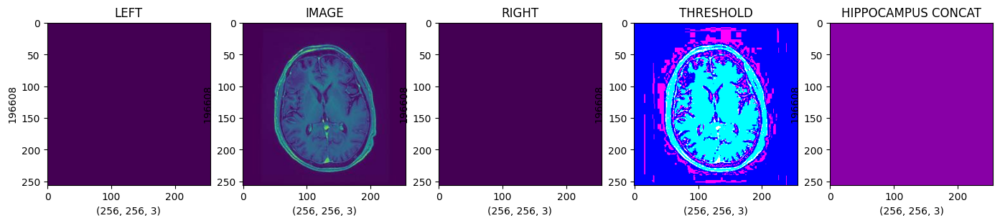

In [262]:
figure,axis = plt.subplots(1,5,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[143]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[143]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[143]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Hıppocampus_Concat.shape)
axis[4].set_ylabel(Hıppocampus_Concat.size)
axis[4].set_title("HIPPOCAMPUS CONCAT")
axis[4].imshow(Hıppocampus_Concat)

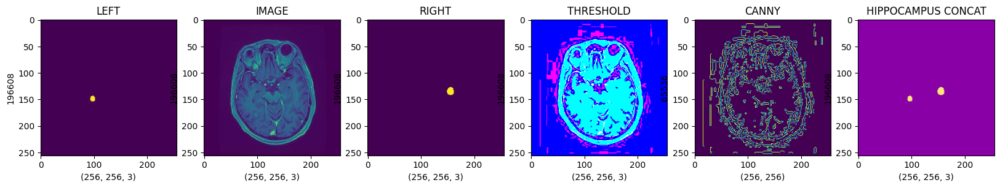

In [263]:
figure,axis = plt.subplots(1,6,figsize=(20,20))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[113]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Hıppocampus_Concat.shape)
axis[5].set_ylabel(Hıppocampus_Concat.size)
axis[5].set_title("HIPPOCAMPUS CONCAT")
axis[5].imshow(Hıppocampus_Concat)

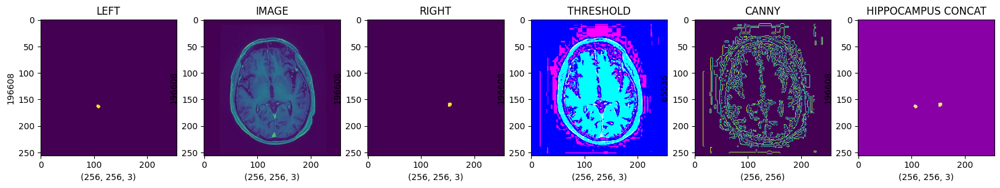

In [34]:
figure,axis = plt.subplots(1,6,figsize=(20,20))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[133]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[133]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[133]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Hıppocampus_Concat.shape)
axis[5].set_ylabel(Hıppocampus_Concat.size)
axis[5].set_title("HIPPOCAMPUS CONCAT")
axis[5].imshow(Hıppocampus_Concat)


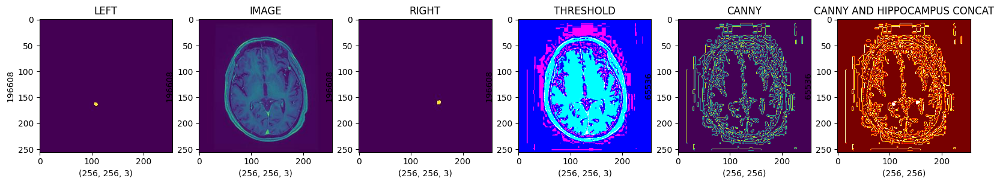

In [35]:
figure,axis = plt.subplots(1,6,figsize=(20,20))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[133]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[133]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[133]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

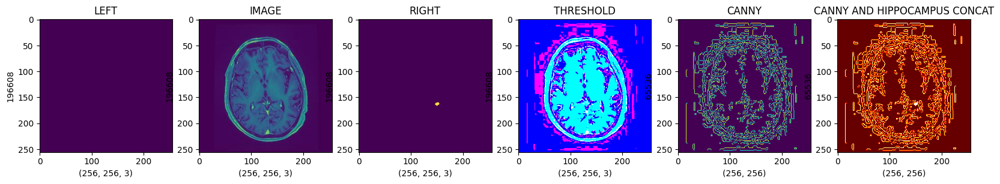

In [36]:
figure,axis = plt.subplots(1,6,figsize=(20,20))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[138]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[138]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[138]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

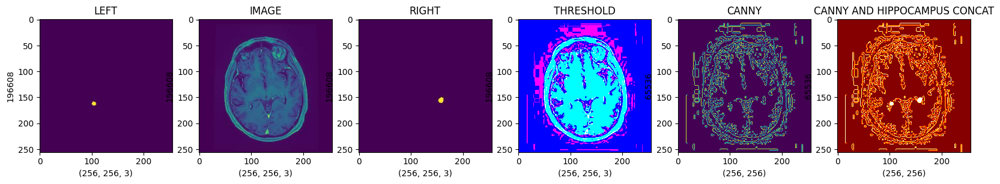

In [37]:
figure,axis = plt.subplots(1,6,figsize=(20,20))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[126]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[126]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[126]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

#### KEYPOINTS

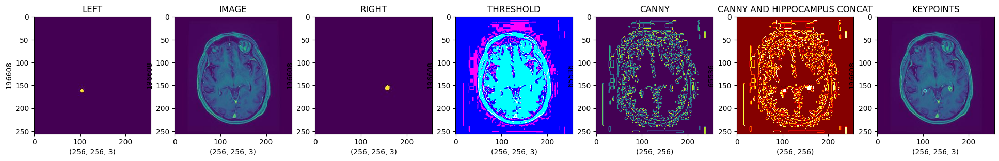

In [38]:
figure,axis = plt.subplots(1,7,figsize=(24,24))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[126]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[126]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[126]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)

Sift_Func = cv2.SIFT_create()
Keypoints,Descript = Sift_Func.detectAndCompute(Hıppocampus_Concat,None)
Keypoints_Out = cv2.drawKeypoints(Example_IMG,Keypoints,Canny_Hıppocampus_Concat)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

axis[6].set_xlabel(Keypoints_Out.shape)
axis[6].set_ylabel(Keypoints_Out.size)
axis[6].set_title("KEYPOINTS")
axis[6].imshow(Keypoints_Out)

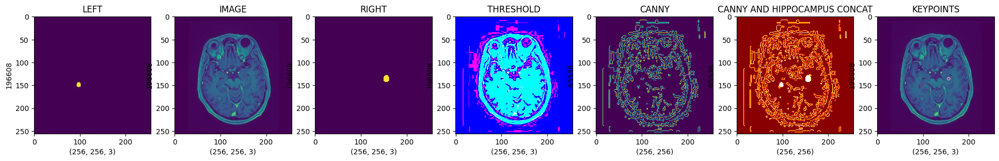

In [39]:
figure,axis = plt.subplots(1,7,figsize=(24,24))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[113]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[113]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)

Sift_Func = cv2.SIFT_create()
Keypoints,Descript = Sift_Func.detectAndCompute(Hıppocampus_Concat,None)
Keypoints_Out = cv2.drawKeypoints(Example_IMG,Keypoints,Canny_Hıppocampus_Concat)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

axis[6].set_xlabel(Keypoints_Out.shape)
axis[6].set_ylabel(Keypoints_Out.size)
axis[6].set_title("KEYPOINTS")
axis[6].imshow(Keypoints_Out)

##### KEYPOINTS OVERVIEW

In [40]:
print(Keypoints)
print("---"*10)
print(Keypoints[0].angle)
print(Keypoints[1].angle)
print(Keypoints[2].angle)
print(Keypoints[3].angle)


(< cv2.KeyPoint 000002ABE54025B0>, < cv2.KeyPoint 000002ABE7974090>, < cv2.KeyPoint 000002ABE7976220>, < cv2.KeyPoint 000002ABE7977B10>)
------------------------------
9.8011474609375
171.77874755859375
2.79901123046875
168.56393432617188


In [41]:
print("octave: ",Keypoints[0].octave)
print("class_id: ",Keypoints[0].class_id)
print("pt: ",Keypoints[0].pt)
print("response: ",Keypoints[0].response)
print("size: ",Keypoints[0].size)

octave:  10289920
class_id:  -1
pt:  (97.30892944335938, 148.62539672851562)
response:  0.08955400437116623
size:  6.57107400894165


#### HESSIAN

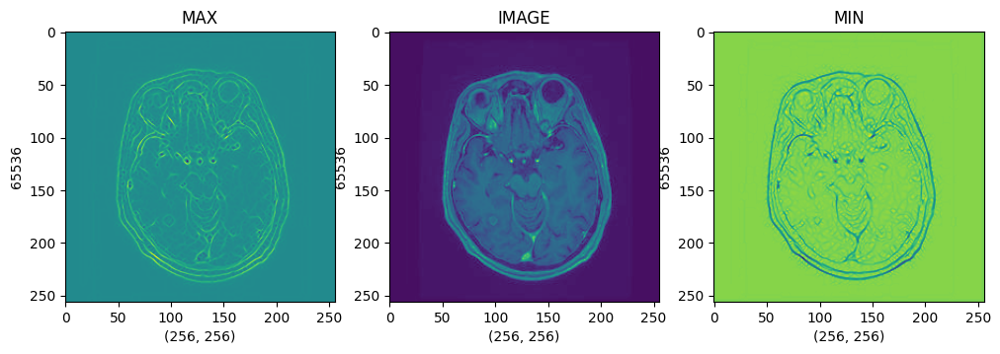

In [42]:
figure,axis = plt.subplots(1,3,figsize=(12,12))

Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[113]),cv2.COLOR_BGR2GRAY)
Hessian_IMG = hessian_matrix(Example_IMG,sigma=0.5,order="rc")
Max_IMG,Min_IMG = hessian_matrix_eigvals(Hessian_IMG)



axis[0].set_xlabel(Max_IMG.shape)
axis[0].set_ylabel(Max_IMG.size)
axis[0].set_title("MAX")
axis[0].imshow(Max_IMG)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Min_IMG.shape)
axis[2].set_ylabel(Min_IMG.size)
axis[2].set_title("MIN")
axis[2].imshow(Min_IMG)

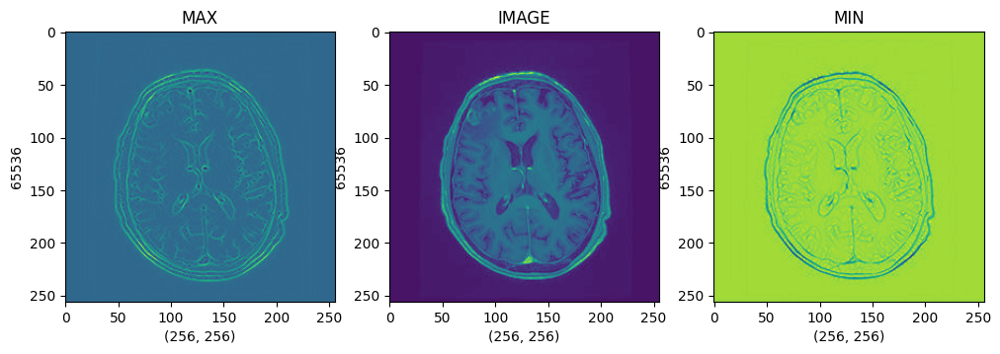

In [43]:
figure,axis = plt.subplots(1,3,figsize=(12,12))

Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[153]),cv2.COLOR_BGR2GRAY)
Hessian_IMG = hessian_matrix(Example_IMG,sigma=0.5,order="rc")
Max_IMG,Min_IMG = hessian_matrix_eigvals(Hessian_IMG)



axis[0].set_xlabel(Max_IMG.shape)
axis[0].set_ylabel(Max_IMG.size)
axis[0].set_title("MAX")
axis[0].imshow(Max_IMG)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Min_IMG.shape)
axis[2].set_ylabel(Min_IMG.size)
axis[2].set_title("MIN")
axis[2].imshow(Min_IMG)

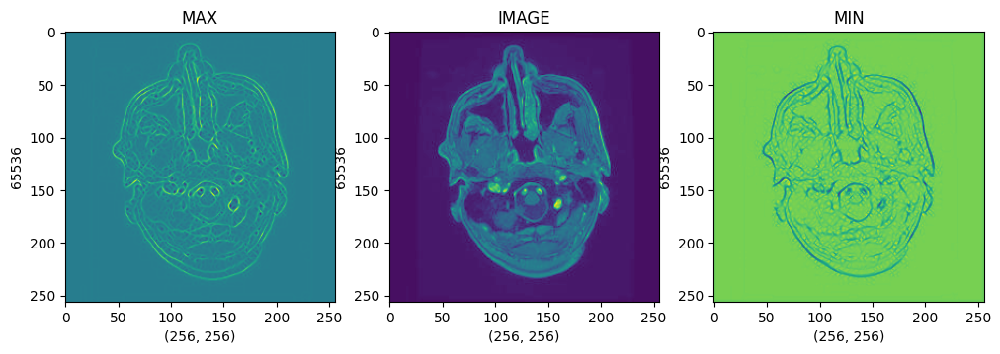

In [44]:
figure,axis = plt.subplots(1,3,figsize=(12,12))

Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[50]),cv2.COLOR_BGR2GRAY)
Hessian_IMG = hessian_matrix(Example_IMG,sigma=0.5,order="rc")
Max_IMG,Min_IMG = hessian_matrix_eigvals(Hessian_IMG)



axis[0].set_xlabel(Max_IMG.shape)
axis[0].set_ylabel(Max_IMG.size)
axis[0].set_title("MAX")
axis[0].imshow(Max_IMG)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Min_IMG.shape)
axis[2].set_ylabel(Min_IMG.size)
axis[2].set_title("MIN")
axis[2].imshow(Min_IMG)

#### SKELETON HIPPOCAMPUS

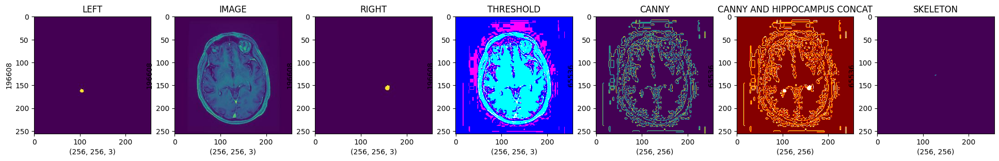

In [45]:
figure,axis = plt.subplots(1,7,figsize=(24,24))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[126]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[126]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[126]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)
_,Threshold_Blend = cv2.threshold(Canny_Hıppocampus_Concat,100,255,cv2.THRESH_TOZERO_INV)
Array_IMG = np.array(Canny_Hıppocampus_Concat > Threshold_Blend).astype(int)
Skeleton_IMG = skimage.morphology.skeletonize(Array_IMG)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

axis[6].set_xlabel(Skeleton_IMG.shape)
axis[6].set_ylabel(Skeleton_IMG.size)
axis[6].set_title("SKELETON")
axis[6].imshow(Skeleton_IMG)

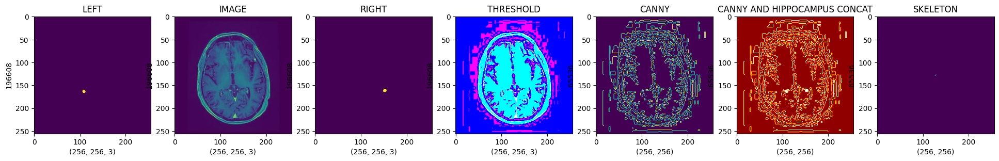

In [46]:
figure,axis = plt.subplots(1,7,figsize=(24,24))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[135]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[135]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[135]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)
_,Threshold_Blend = cv2.threshold(Canny_Hıppocampus_Concat,100,255,cv2.THRESH_TOZERO_INV)
Array_IMG = np.array(Canny_Hıppocampus_Concat > Threshold_Blend).astype(int)
Skeleton_IMG = skimage.morphology.skeletonize(Array_IMG)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

axis[6].set_xlabel(Skeleton_IMG.shape)
axis[6].set_ylabel(Skeleton_IMG.size)
axis[6].set_title("SKELETON")
axis[6].imshow(Skeleton_IMG)

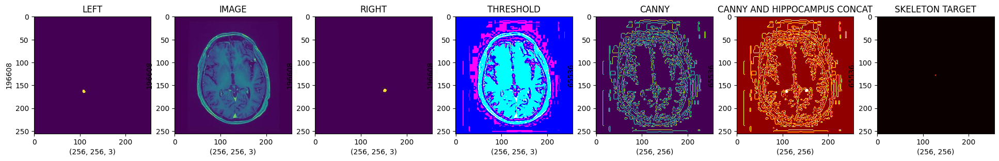

In [47]:
figure,axis = plt.subplots(1,7,figsize=(24,24))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[135]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[135]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[135]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

_,Threshold_Blend = cv2.threshold(Hıppocampus_Concat[:,:,0],100,255,cv2.THRESH_TOZERO_INV)
Array_IMG = np.array(Hıppocampus_Concat[:,:,0] > Threshold_Blend).astype(int)
Skeleton_IMG = skimage.morphology.skeletonize(Array_IMG)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat,cmap="hot")

axis[6].set_xlabel(Skeleton_IMG.shape)
axis[6].set_ylabel(Skeleton_IMG.size)
axis[6].set_title("SKELETON TARGET")
axis[6].imshow(Skeleton_IMG,cmap="hot")

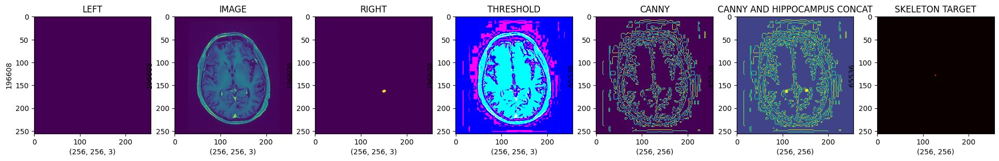

In [48]:
figure,axis = plt.subplots(1,7,figsize=(24,24))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[138]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[138]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[138]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

_,Threshold_Blend = cv2.threshold(Hıppocampus_Concat[:,:,0],100,255,cv2.THRESH_TOZERO_INV)
Array_IMG = np.array(Hıppocampus_Concat[:,:,0] > Threshold_Blend).astype(int)
Skeleton_IMG = skimage.morphology.skeletonize(Array_IMG)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat)

axis[6].set_xlabel(Skeleton_IMG.shape)
axis[6].set_ylabel(Skeleton_IMG.size)
axis[6].set_title("SKELETON TARGET")
axis[6].imshow(Skeleton_IMG,cmap="hot")

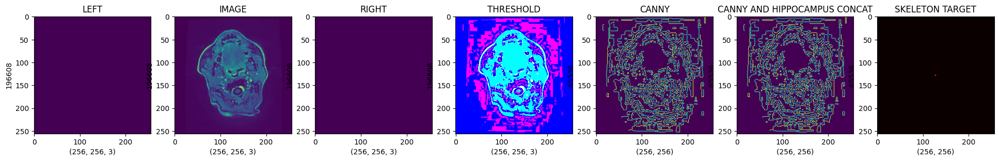

In [49]:
figure,axis = plt.subplots(1,7,figsize=(24,24))

Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[10]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[10]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[10]),cv2.COLOR_BGR2RGB)
Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)
_,Threshold_Blend = cv2.threshold(Canny_Hıppocampus_Concat,100,255,cv2.THRESH_TOZERO_INV)
Array_IMG = np.array(Canny_Hıppocampus_Concat > Threshold_Blend).astype(int)
Skeleton_IMG = skimage.morphology.skeletonize(Array_IMG)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus_Concat.shape)
axis[5].set_ylabel(Canny_Hıppocampus_Concat.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS CONCAT")
axis[5].imshow(Canny_Hıppocampus_Concat)

axis[6].set_xlabel(Skeleton_IMG.shape)
axis[6].set_ylabel(Skeleton_IMG.size)
axis[6].set_title("SKELETON TARGET")
axis[6].imshow(Skeleton_IMG,cmap="hot")

# DATA PROCESS

#### TRANSFORMATION I

In [50]:
X_Image = []
X_Hippocampus = []

for x_image,x_l,x_r in zip(Image_Series,Left_Label_Series,Right_Label_Series):
    
    Picking_L = cv2.cvtColor(cv2.imread(x_l),cv2.COLOR_BGR2RGB)
    Picking_R = cv2.cvtColor(cv2.imread(x_r),cv2.COLOR_BGR2RGB)
    Picking_IMG = cv2.cvtColor(cv2.imread(x_image),cv2.COLOR_BGR2RGB)
    Hıppocampus_Concat = cv2.addWeighted(Picking_L,1,Picking_R,1,0.2)
    _,Threshold_IMG = cv2.threshold(Picking_IMG,70,255,cv2.THRESH_BINARY)
    Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
    Canny_Hıppocampus_Concat = cv2.addWeighted(Canny_IMG,1,Hıppocampus_Concat[:,:,0],1,0.2)
    
    Picking_IMG = Picking_IMG / 255.
    Canny_Hıppocampus_Concat = Canny_Hıppocampus_Concat / 255.
    
    X_Image.append(Picking_IMG)
    X_Hippocampus.append(Canny_Hıppocampus_Concat)

In [51]:
print("ARRAY IMAGE SHAPE: ",np.shape(np.array(X_Image)))
print("ARRAY HIPPOCAMPUS SHAPE: ",np.shape(np.array(X_Hippocampus)))

ARRAY IMAGE SHAPE:  (276, 256, 256, 3)
ARRAY HIPPOCAMPUS SHAPE:  (276, 256, 256)


Text(0.5, 1.0, 'TRANSFORMATION')

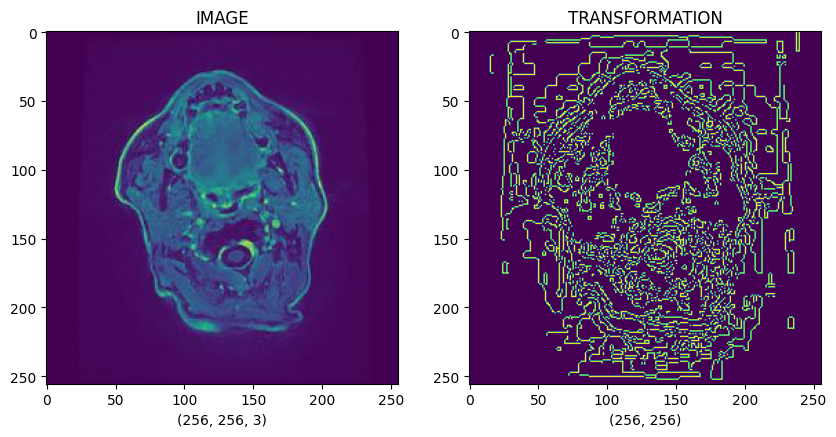

In [52]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(X_Image[10])
axis[0].set_xlabel(X_Image[10].shape)
axis[0].set_title("IMAGE")
axis[1].imshow(X_Hippocampus[10])
axis[1].set_xlabel(X_Hippocampus[10].shape)
axis[1].set_title("TRANSFORMATION")

Text(0.5, 1.0, 'TRANSFORMATION')

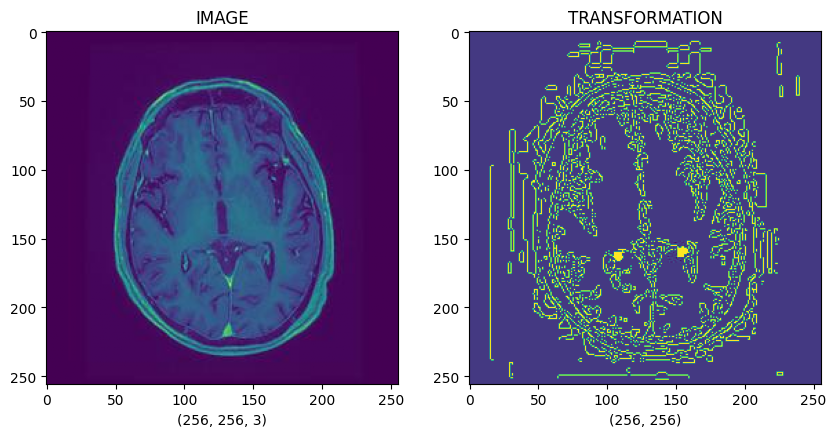

In [53]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

axis[0].imshow(X_Image[133])
axis[0].set_xlabel(X_Image[133].shape)
axis[0].set_title("IMAGE")
axis[1].imshow(X_Hippocampus[133])
axis[1].set_xlabel(X_Hippocampus[133].shape)
axis[1].set_title("TRANSFORMATION")

#### TRANSFORMATION II

In [54]:
Image_New = []
Hippocampus_Mask = []

for x_image,x_l,x_r in zip(Image_Series,Left_Label_Series,Right_Label_Series):
    
    Picking_L = cv2.cvtColor(cv2.imread(x_l),cv2.COLOR_BGR2RGB)
    Picking_R = cv2.cvtColor(cv2.imread(x_r),cv2.COLOR_BGR2RGB)
    Picking_IMG = cv2.cvtColor(cv2.imread(x_image),cv2.COLOR_BGR2RGB)
    Hıppocampus_Concat = cv2.addWeighted(Picking_L,1,Picking_R,1,0.2)
    
    Picking_IMG = Picking_IMG / 255.
    Hıppocampus_Concat = Hıppocampus_Concat / 255.
    
    Image_New.append(Picking_IMG)
    Hippocampus_Mask.append(Hıppocampus_Concat)

In [55]:
print("ARRAY IMAGE SHAPE: ",np.shape(np.array(Image_New)))
print("ARRAY HIPPOCAMPUS SHAPE: ",np.shape(np.array(Hippocampus_Mask)))

ARRAY IMAGE SHAPE:  (276, 256, 256, 3)
ARRAY HIPPOCAMPUS SHAPE:  (276, 256, 256, 3)


#### TO ARRAY

In [56]:
Image_Array = np.array(X_Image,dtype="float32")
Hippocampus_Array = np.array(X_Hippocampus,dtype="float32")

In [57]:
Image_New = np.array(Image_New,dtype="float32")
Hippocampus_Mask = np.array(Hippocampus_Mask,dtype="float32")

In [58]:
print(type(Image_Array))
print(type(Hippocampus_Array))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [59]:
print(Image_Array[0].dtype)
print(Hippocampus_Array[0].dtype)

float32
float32


# MODEL I

In [189]:
Encoder_G = Sequential()
Encoder_G.add(Conv2D(32,(2,2),kernel_initializer = 'he_normal'))
Encoder_G.add(BatchNormalization())
Encoder_G.add(ReLU())
#
Encoder_G.add(Conv2D(64,(2,2),kernel_initializer = 'he_normal'))
Encoder_G.add(BatchNormalization())
Encoder_G.add(ReLU())
#
Encoder_G.add(Conv2D(128,(2,2),kernel_initializer = 'he_normal'))
Encoder_G.add(BatchNormalization())
Encoder_G.add(ReLU())


Decoder_G = Sequential()
Decoder_G.add(Conv2DTranspose(64,(2,2)))
Decoder_G.add(ReLU())
#
Decoder_G.add(Conv2DTranspose(32,(2,2)))
Decoder_G.add(ReLU())
#
Decoder_G.add(Conv2DTranspose(1,(2,2)))
Decoder_G.add(ReLU())

Auto_Encoder = Sequential([Encoder_G,Decoder_G])

In [190]:
Auto_Encoder.compile(loss="binary_crossentropy",optimizer="adam",metrics=["mse"])

In [ ]:
Auto_Encoder_Model = Auto_Encoder.fit(Image_Array[:100],Hippocampus_Array[:100],epochs=25)

Epoch 1/25


#### PREDICTION

In [ ]:
Prediction_IMG = Auto_Encoder.predict(Image_Array[:10])

Text(0.5, 1.0, 'PREDICTION')

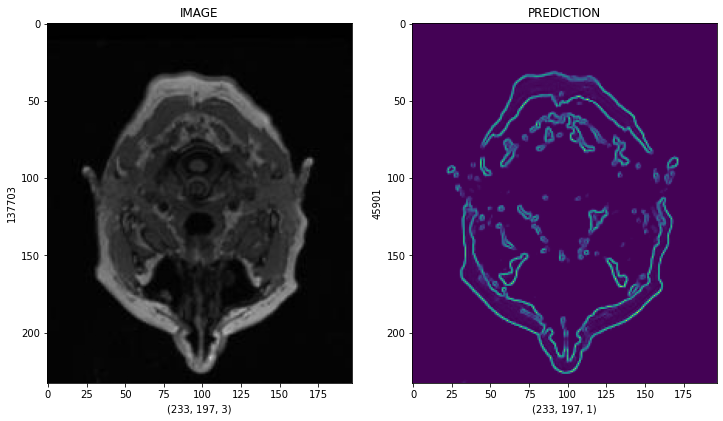

In [90]:
figure,axis = plt.subplots(1,2,figsize=(12,12))
prediction_img_number = 1

Original_Img = Image_Array[prediction_img_number]
Predict_Hippocampus = Prediction_IMG[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

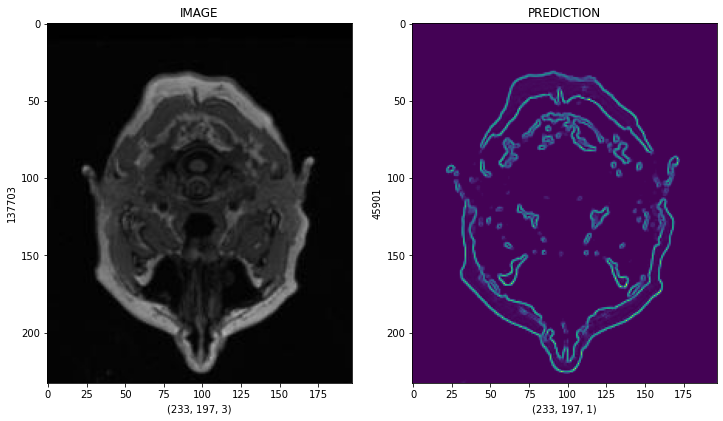

In [91]:
figure,axis = plt.subplots(1,2,figsize=(12,12))
prediction_img_number = 2

Original_Img = Image_Array[prediction_img_number]
Predict_Hippocampus = Prediction_IMG[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

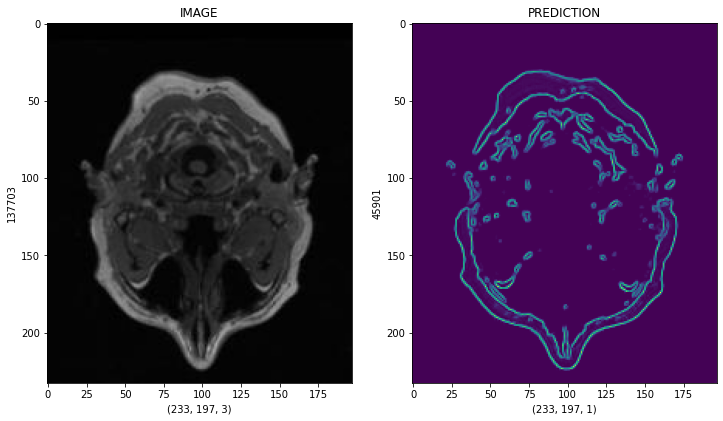

In [92]:
figure,axis = plt.subplots(1,2,figsize=(12,12))
prediction_img_number = 8

Original_Img = Image_Array[prediction_img_number]
Predict_Hippocampus = Prediction_IMG[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

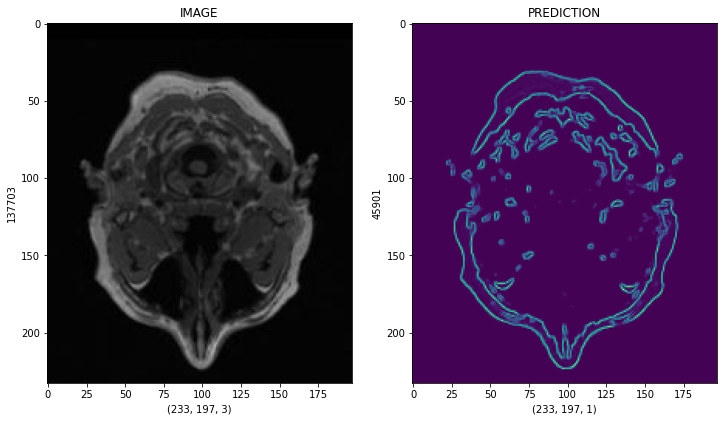

In [93]:
figure,axis = plt.subplots(1,2,figsize=(12,12))
prediction_img_number = 9

Original_Img = Image_Array[prediction_img_number]
Predict_Hippocampus = Prediction_IMG[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

In [97]:
Prediction_IMG = Auto_Encoder.predict(Image_Array[133:1021])

Text(0.5, 1.0, 'PREDICTION')

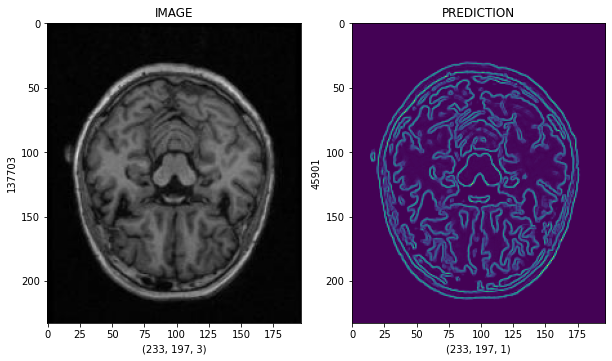

In [96]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Original_Img = Image_Array[133]
Predict_Hippocampus = Prediction_IMG[0]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

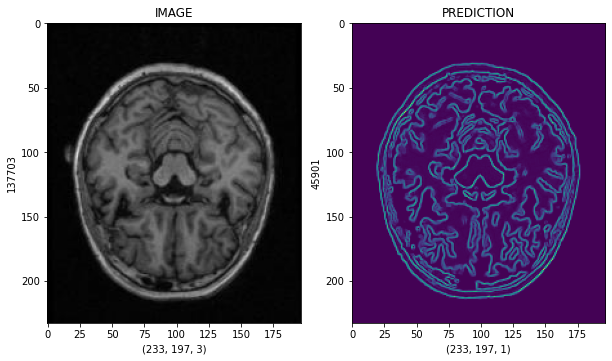

In [98]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Original_Img = Image_Array[1002]
Predict_Hippocampus = Prediction_IMG[2]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

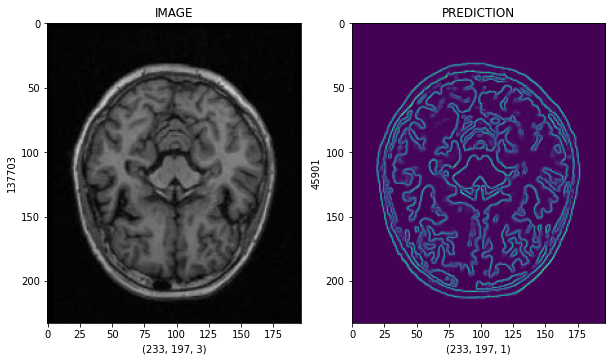

In [99]:
figure,axis = plt.subplots(1,2,figsize=(10,10))

Original_Img = Image_Array[1003]
Predict_Hippocampus = Prediction_IMG[3]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

# MODEL II

In [27]:
Encoder_GII = Sequential()
Encoder_GII.add(Conv2D(20,(5,5),kernel_initializer = 'he_normal',use_bias=True))
Encoder_GII.add(BatchNormalization())
Encoder_GII.add(ReLU())
#
Encoder_GII.add(Conv2D(40,(5,5),kernel_initializer = 'he_normal',use_bias=True))
Encoder_GII.add(BatchNormalization())
Encoder_GII.add(ReLU())
#
Encoder_GII.add(Conv2D(120,(5,5),kernel_initializer = 'he_normal',use_bias=True))
Encoder_GII.add(BatchNormalization())
Encoder_GII.add(ReLU())


Decoder_GII = Sequential()
Decoder_GII.add(Conv2DTranspose(40,(5,5)))
Decoder_GII.add(ReLU())
#
Decoder_GII.add(Conv2DTranspose(20,(5,5)))
Decoder_GII.add(ReLU())
#
Decoder_GII.add(Conv2DTranspose(1,(5,5)))
Decoder_GII.add(ReLU())

Auto_Encoder_II = Sequential([Encoder_GII,Decoder_GII])

In [28]:
Auto_Encoder_II.compile(loss="binary_crossentropy",optimizer=Adam(lr=0.000001),metrics=["mse"])

In [29]:
Auto_Encoder_Model_II = Auto_Encoder_II.fit(Image_New[:1100],Hippocampus_Mask[:1100],epochs=25)

Epoch 1/25
35/35 [==============================] - 14s 248ms/step - loss: 3.5183 - mse: 0.6845
Epoch 2/25
35/35 [==============================] - 8s 231ms/step - loss: 2.8129 - mse: 0.5141
Epoch 3/25
35/35 [==============================] - 8s 230ms/step - loss: 2.1243 - mse: 0.3695
Epoch 4/25
35/35 [==============================] - 8s 230ms/step - loss: 1.4871 - mse: 0.2613
Epoch 5/25
35/35 [==============================] - 8s 231ms/step - loss: 1.0520 - mse: 0.1875
Epoch 6/25
35/35 [==============================] - 8s 231ms/step - loss: 0.7764 - mse: 0.1400
Epoch 7/25
35/35 [==============================] - 8s 230ms/step - loss: 0.6016 - mse: 0.1087
Epoch 8/25
35/35 [==============================] - 8s 230ms/step - loss: 0.4886 - mse: 0.0870
Epoch 9/25
35/35 [==============================] - 8s 230ms/step - loss: 0.4059 - mse: 0.0710
Epoch 10/25
35/35 [==============================] - 8s 230ms/step - loss: 0.3443 - mse: 0.0582
Epoch 11/25
35/35 [=============================

#### PREDICTION

In [30]:
Prediction_IMG_II = Auto_Encoder_II.predict(Image_New[:10])

Text(0.5, 1.0, 'PREDICTION')

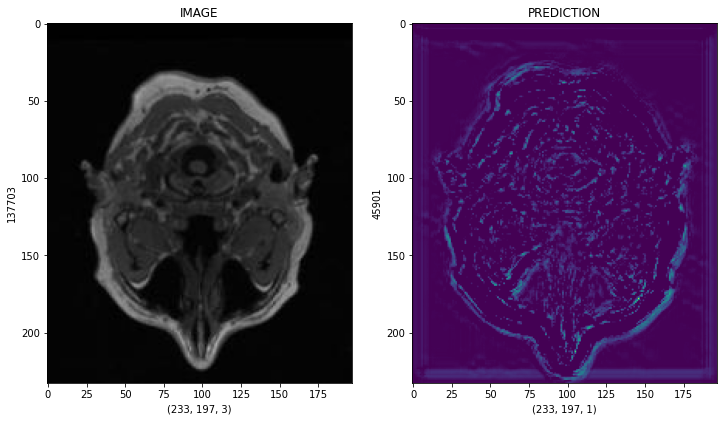

In [31]:
figure,axis = plt.subplots(1,2,figsize=(12,12))
prediction_img_number = 8

Original_Img = Image_New[prediction_img_number]
Predict_Hippocampus = Prediction_IMG_II[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

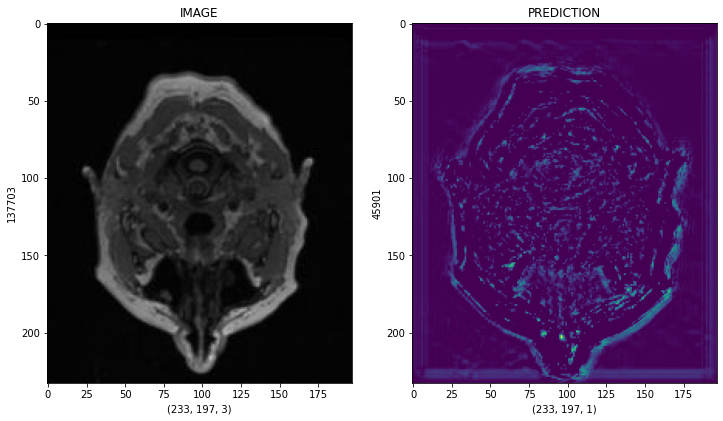

In [32]:
figure,axis = plt.subplots(1,2,figsize=(12,12))
prediction_img_number = 1

Original_Img = Image_New[prediction_img_number]
Predict_Hippocampus = Prediction_IMG_II[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

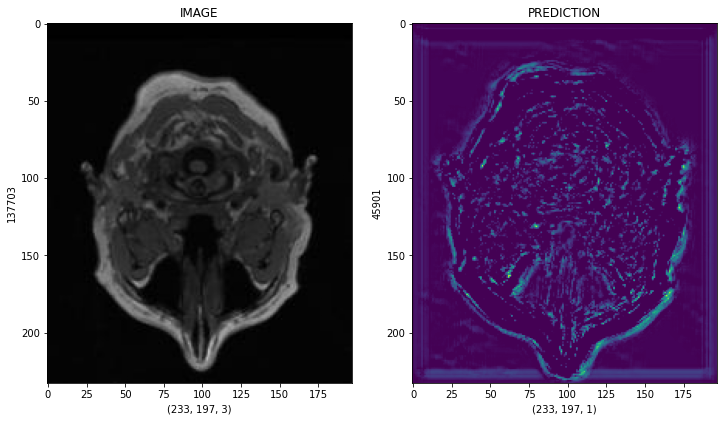

In [33]:
figure,axis = plt.subplots(1,2,figsize=(12,12))
prediction_img_number = 6

Original_Img = Image_New[prediction_img_number]
Predict_Hippocampus = Prediction_IMG_II[prediction_img_number]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

In [34]:
Prediction_IMG_Non_Seen = Auto_Encoder_II.predict(Image_New[133:1021])

Text(0.5, 1.0, 'PREDICTION')

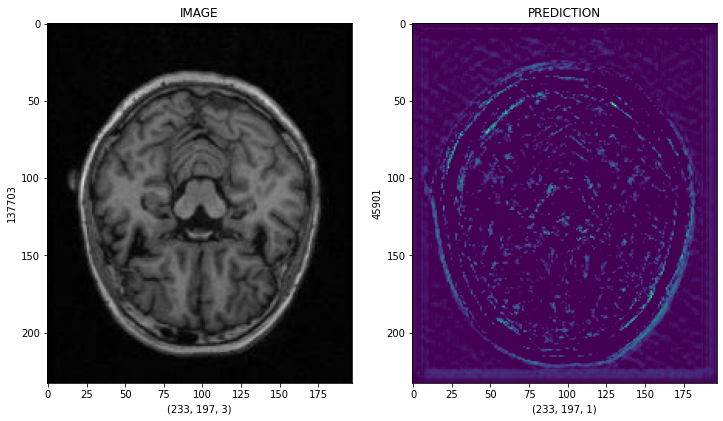

In [35]:
figure,axis = plt.subplots(1,2,figsize=(12,12))

Original_Img = Image_New[133]
Predict_Hippocampus = Prediction_IMG_Non_Seen[0]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

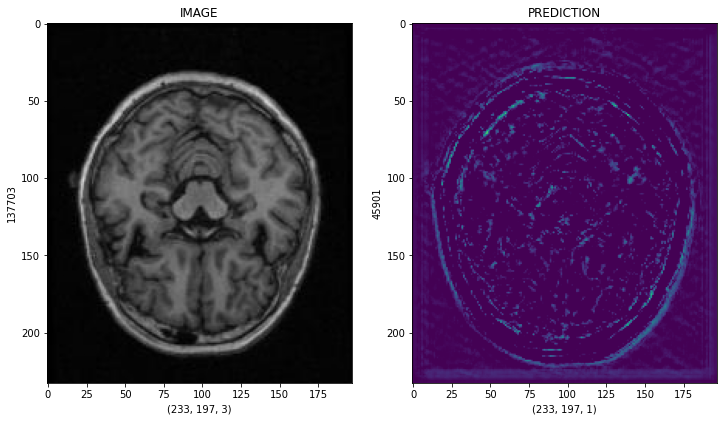

In [36]:
figure,axis = plt.subplots(1,2,figsize=(12,12))

Original_Img = Image_New[1001]
Predict_Hippocampus = Prediction_IMG_Non_Seen[1]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

Text(0.5, 1.0, 'PREDICTION')

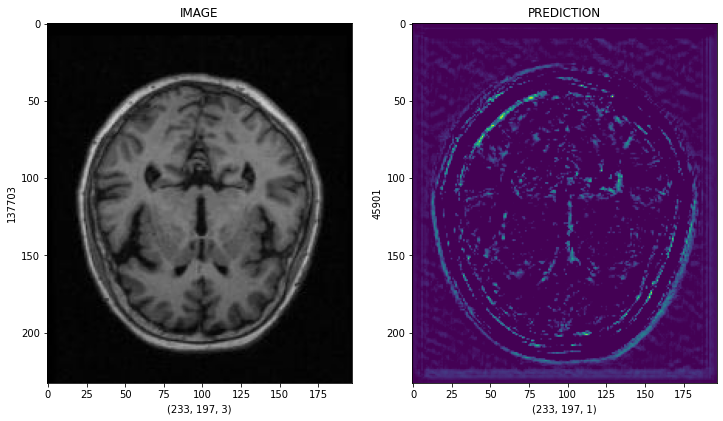

In [37]:
figure,axis = plt.subplots(1,2,figsize=(12,12))

Original_Img = Image_New[1011]
Predict_Hippocampus = Prediction_IMG_Non_Seen[11]

axis[0].imshow(Original_Img)
axis[0].set_xlabel(Original_Img.shape)
axis[0].set_ylabel(Original_Img.size)
axis[0].set_title("IMAGE")
axis[1].imshow(Predict_Hippocampus)
axis[1].set_xlabel(Predict_Hippocampus.shape)
axis[1].set_ylabel(Predict_Hippocampus.size)
axis[1].set_title("PREDICTION")

# Building VGG &COCO Annotation

In [1]:
  """
  preprocess_path : path to folder with gt and images subfolder containing ground truth binary label image and visual imagery
  res : spatial resolution of images in meter 
  surf : the minimum surface of roof considered in the study in square meter
  eps : the index for Ramer–Douglas–Peucker (RDP) algorithm for contours approx to decrease nb of points describing a contours
  """
import codecs 
from tqdm import tqdm
import json
def Annot(preprocess_path, res=0.6, surf=0.5, eps=0.01):
    jsonf = {} # only one big annotation file
    print(preprocess_path)
    a=preprocess_path[-2:]
    b="via_region_data_"+str(a)+".json"
    with open(os.path.join(preprocess_path,b), 'w') as js_file:
        gt_path = os.path.join(preprocess_path, 'masks_both/')
        images_path = os.path.join(preprocess_path, 'images/')
        
        # All the elements in the images folders
        lst = os.listdir(images_path)
        for elt in tqdm(lst, desc='lst'):
        
            # Read the binary mask, and find the contours associated
            gray = cv2.imread(os.path.join(gt_path, elt))
            imgray = cv2.cvtColor(gray, cv2.COLOR_BGR2GRAY)
            _, thresh = cv2.threshold(imgray, 127, 255, 0)
            contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
            # https://www.pyimagesearch.com/2021/10/06/opencv-contour-approximation/
            # Contours approximation based on Ramer–Douglas–Peucker (RDP) algorithm
            areas = [cv2.contourArea(contours[idx])*res*res for idx in range(len(contours))]
            large_contour = []
            for i in range(len(areas)):
                if areas[i]>surf:
                    large_contour.append(contours[i])
            approx_contour = [cv2.approxPolyDP(c, eps * cv2.arcLength(c, True), True) for c in large_contour]
            
            # -------------------------------------------------------------------------------
            # BUILDING VGG ANNOTATION TOOL ANNOTATIONS LIKE 
            if len(approx_contour) > 0:
                regions = [0 for i in range(len(approx_contour))]
                for i in range(len(approx_contour)):
                    shape_attributes = {}
                    region_attributes = {}
                    region_attributes['class'] = 'hippocampus'
                    regionsi = {}
                    shape_attributes['name'] = 'polygon'
                    shape_attributes['all_points_x'] = approx_contour[i][:, 0][:, 0].tolist()
                    # https://stackoverflow.com/questions/26646362/numpy-array-is-not-json-serializable
                    shape_attributes['all_points_y'] = approx_contour[i][:, 0][:, 1].tolist()
                    regionsi['shape_attributes'] = shape_attributes
                    regionsi['region_attributes'] = region_attributes
                    regions[i] = regionsi
                    
                x=str(os.path.join(images_path, elt)).split("Desktop")
                size = os.path.getsize(os.path.join(images_path, elt))
                name = elt + str(size)
                json_elt = {}
                y=x[1][1:].replace("\\","/")
                y=y.split("/")[-1]
                json_elt['filename'] = y
                json_elt['size'] = str(size)
                json_elt['regions'] = regions
                json_elt['file_attributes'] = {}
                jsonf[name] = json_elt
        for k,v in jsonf.items():
            print(k,v)
        json.dump(jsonf, js_file)
    
   

In [207]:
preprocess_path="C:/Users/Adwait/Desktop/Nanavati dataset/0"+str(i)
a=preprocess_path.split("/")[-2]
b="via_region_data_"+str(a)+".json"
print(b)

via_region_data_01.json


In [121]:

for i in range(1,26):
    if(i<10): 
        Label_Path_org = Path("C:/Users/Adwait/Desktop/Nanavati dataset/0"+str(i)+"/masks/")
        Image_Path_org = Path("C:/Users/Adwait/Desktop/Nanavati dataset/0"+str(i)+"/images/")
        output_path=Path("C:/Users/Adwait/Desktop/Nanavati dataset/0"+str(i)+"/masks_both/")
    else:
        Label_Path_org = Path("C:/Users/Adwait/Desktop/Nanavati dataset/"+str(i)+"/masks/")
        Image_Path_org = Path("C:/Users/Adwait/Desktop/Nanavati dataset/"+str(i)+"/images/")
        output_path=Path("C:/Users/Adwait/Desktop/Nanavati dataset/"+str(i)+"/masks_both/")
    print(Label_Path_org)
    print("---"*100)
    print(Image_Path_org)
    print("---"*100)
    Label_Path = list(Label_Path_org.glob(r"**/*.jpg"))
    Image_Path = list(Image_Path_org.glob(r"**/*.jpg"))
    Label_Series = pd.Series(Label_Path,name="LABEL").astype(str)
    Image_Series = pd.Series(Image_Path,name="IMAGE").astype(str)
    Label_Series=sorted_alphanumeric(Label_Series)
    Left_Label_Series=Label_Series[0:len(Image_Series)]
    print(Left_Label_Series)
    print("---"*100)
    Right_Label_Series=Label_Series[len(Image_Series):]
    print(Right_Label_Series)
    print("---"*100)
    Image_Series=sorted_alphanumeric(Image_Series)
    for i in range(len(Left_Label_Series)):
        Example_L = cv2.cvtColor(cv2.imread(Left_Label_Series[i]),cv2.COLOR_BGR2RGB)
        Example_R = cv2.cvtColor(cv2.imread(Right_Label_Series[i]),cv2.COLOR_BGR2RGB)
        Example_IMG = cv2.cvtColor(cv2.imread(Image_Series[i]),cv2.COLOR_BGR2RGB)
        Hıppocampus_Concat = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
        x=str(output_path)+"/image_"+str(i)+".jpg"
        print(x)
        cv2.imwrite(x, Hıppocampus_Concat)
        

C:\Users\Adwait\Desktop\Nanavati dataset\01\masks
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
C:\Users\Adwait\Desktop\Nanavati dataset\01\images
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
['C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks\\image_0.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks\\image_1.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks\\image_2.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\m

['C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_0.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_1.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_2.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_3.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_4.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_5.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_6.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_7.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_8.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_9.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_10.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\01\\masks\\masks_L\\image_11.jpg', 'C:\\Users\\Adwait\\Deskt

C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_24.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_25.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_26.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_27.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_28.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_29.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_30.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_31.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\mask

C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_151.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_152.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_153.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_154.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_155.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_156.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_157.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_158.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_159.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_160.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_161.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_162.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_163.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_274.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\01\masks_both/image_275.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
C:\Users\Adwait\Desktop\Nanavati dataset\02\images
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
['C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\02\\masks\\masks_L\\mask_0.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\02\\masks\\masks_L\\mask_1.jpg'

C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_24.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_25.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_26.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_27.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_28.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\mask

C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_155.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_156.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_157.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_158.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_159.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_160.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_161.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_162.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_163.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_164.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_165.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_166.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_167.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_168.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\02\masks_both/image_291.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
C:\Users\Adwait\Desktop\Nanavati dataset\03\images
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
['C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\03\\masks\\masks_L\\mask_0.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\03\\masks\\masks_L\\mask_1.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\03\\masks\\masks_L\\

C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_24.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\mask

C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_140.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_141.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_142.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_143.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_144.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_145.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_146.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_147.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_148.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_149.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_151.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_152.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_153.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_263.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_264.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_265.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_266.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_267.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_268.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_269.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_270.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_271.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_272.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_273.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_274.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_275.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_276.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_386.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_387.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_388.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_389.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_390.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\03\masks_both/image_391.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
C:\Users\Adwait\Desktop\Nanavati dataset\04\images
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_24.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_25.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_26.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_27.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_28.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_29.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_30.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_31.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_32.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_33.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\mask

C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_141.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_142.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_143.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_144.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_145.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_146.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_147.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_148.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_149.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_151.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_152.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_153.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_154.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_273.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_274.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_275.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_276.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_277.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_278.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_279.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_280.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_281.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_282.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_283.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_284.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_285.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\04\masks_both/image_286.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\mask

C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_141.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_142.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_143.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_144.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_145.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_146.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_147.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_148.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_149.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_151.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_152.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_153.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_154.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_263.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_264.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_265.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_266.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_267.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_268.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_269.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_270.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_271.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_272.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_273.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_274.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_275.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\05\masks_both/image_276.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_6.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_bo

C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_139.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_140.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_141.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_142.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_143.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_144.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_145.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_146.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_147.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_148.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_149.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_151.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_264.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_265.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_266.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_267.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_268.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_269.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_270.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_271.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_272.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_273.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_274.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_275.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_276.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\06\masks_both/image_277.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_24.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_25.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\mask

C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_139.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_140.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_141.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_142.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_143.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_144.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_145.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_146.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_147.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_148.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_149.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_151.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_152.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_270.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_271.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_272.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_273.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_274.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_275.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_276.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_277.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_278.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_279.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_280.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_281.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_282.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\07\masks_both/image_283.jpg
C:\Users\Adwait\Desktop\Nanavati d

['C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_0.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_1.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_2.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_3.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_4.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_5.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_6.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_7.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_8.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_9.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_10.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\08\\masks\\masks_L\\mask_11.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati

C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_24.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_25.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_26.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_27.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\mask

C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_142.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_143.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_144.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_145.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_146.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_147.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_148.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_149.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_151.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_152.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_153.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_154.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_155.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_276.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_277.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_278.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_279.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_280.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_281.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_282.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_283.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_284.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_285.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_286.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_287.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_288.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\08\masks_both/image_289.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_24.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\mask

C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_151.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_152.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_153.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_154.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_155.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_156.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_157.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_158.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_159.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_160.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_161.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_162.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_163.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_164.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_295.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_296.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_297.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_298.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_299.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_300.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_301.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_302.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_303.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_304.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_305.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_306.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_307.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\09\masks_both/image_308.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_5.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_6.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_bot

C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_137.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_139.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_140.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_141.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_142.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_143.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_144.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_145.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_146.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_147.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_148.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_149.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_272.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_273.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_274.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_275.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_276.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_277.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_278.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_279.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_280.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_281.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_282.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_283.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_284.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\10\masks_both/image_285.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_24.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_25.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_26.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_27.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\mask

C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_149.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_151.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_152.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_153.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_154.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_155.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_156.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_157.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_158.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_159.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_160.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_161.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\11\masks_both/image_162.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_24.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_25.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\mask

C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_134.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_135.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_136.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_137.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_139.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_140.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_141.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_142.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_143.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_144.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_145.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_146.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_147.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_261.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_262.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_263.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_264.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_265.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_266.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_267.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_268.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_269.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_270.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_271.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_272.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_273.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\12\masks_both/image_274.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_b

C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_151.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_152.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_153.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_154.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_155.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_156.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_157.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_158.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_159.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_160.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_161.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_162.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_163.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_270.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_271.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_272.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_273.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_274.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_275.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_276.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_277.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_278.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_279.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_280.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_281.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_282.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\13\masks_both/image_283.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_24.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_25.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_26.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_27.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_28.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_29.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_30.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_31.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_32.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_33.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_34.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\mask

C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_155.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_156.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_157.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_158.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_159.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_160.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_161.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_162.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_163.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_164.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_165.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_166.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_167.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_168.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_281.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_282.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_283.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_284.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_285.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_286.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_287.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_288.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_289.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_290.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\14\masks_both/image_291.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_0.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_1.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_2.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_3.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_4.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_5.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_6.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/ima

C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_137.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_139.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_140.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_141.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_142.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_143.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_144.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_145.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_146.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_147.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_148.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_149.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_261.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_262.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_263.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_264.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_265.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_266.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_267.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_268.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_269.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_270.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_271.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_272.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_273.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\15\masks_both/image_274.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_22.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_23.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_24.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_25.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_26.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_27.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_28.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_29.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\mask

C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_148.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_149.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_150.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_151.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_152.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_153.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_154.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_155.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_156.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_157.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_158.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_159.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_160.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_161.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_275.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_276.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_277.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_278.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_279.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_280.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_281.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_282.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_283.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_284.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_285.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_286.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_287.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\16\masks_both/image_288.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_0.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_1.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_2.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_3.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_4.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_5.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_6.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/ima

C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_121.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_122.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_123.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_124.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_125.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_126.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_127.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_128.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_129.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_130.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_131.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_132.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_133.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_134.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_243.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_244.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_245.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_246.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_247.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_248.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_249.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_250.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_251.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_252.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_253.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_254.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_255.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\17\masks_both/image_256.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_3.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_4.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_5.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_6.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/

C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_125.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_126.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_127.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_128.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_129.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_130.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_131.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_132.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_133.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_134.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_135.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_136.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_137.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_250.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_251.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_252.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_253.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_254.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_255.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_256.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_257.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_258.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_259.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_260.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_261.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_262.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\18\masks_both/image_263.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_4.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_5.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_6.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both

C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_125.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_126.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_127.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_128.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_129.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_130.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_131.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_132.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_133.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_134.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_135.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_136.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_137.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\19\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_3.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_4.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_5.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_6.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/

C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_127.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_128.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_129.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_130.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_131.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_132.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_133.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_134.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_135.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_136.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_137.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_139.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_140.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_250.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_251.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_252.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_253.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_254.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_255.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_256.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_257.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_258.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_259.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_260.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_261.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_262.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\20\masks_both/image_263.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_19.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_20.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_21.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_

C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_131.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_132.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_133.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_134.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_135.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_136.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_137.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_139.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_140.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_141.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_142.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_143.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_144.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_251.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_252.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_253.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_254.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_255.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_256.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_257.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_258.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_259.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_260.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_261.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_262.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_263.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\21\masks_both/image_264.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_0.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_1.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_2.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_3.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_4.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_5.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_6.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/ima

C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_125.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_126.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_127.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_128.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_129.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_130.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_131.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_132.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_133.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_134.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_135.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_136.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_137.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_245.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_246.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_247.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_248.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_249.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_250.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_251.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_252.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_253.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_254.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_255.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_256.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_257.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\22\masks_both/image_258.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_5.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_6.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_18.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_bot

C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_127.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_128.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_129.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_130.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_131.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_132.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_133.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_134.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_135.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_136.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_137.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_139.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_140.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_252.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_253.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_254.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_255.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_256.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_257.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_258.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_259.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_260.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_261.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_262.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_263.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_264.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\23\masks_both/image_265.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_0.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_1.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_2.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_3.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_4.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_5.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_6.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/ima

C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_125.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_126.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_127.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_128.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_129.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_130.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_131.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_132.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_133.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_134.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_135.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_136.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_137.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_244.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_245.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_246.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_247.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_248.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_249.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_250.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_251.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_252.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_253.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_254.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_255.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_256.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\24\masks_both/image_257.jpg
C:\Users\Adwait\Desktop\Nanavati d

['C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_0.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_1.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_2.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_3.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_4.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_5.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_6.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_7.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_8.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_9.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_10.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati dataset\\25\\masks\\masks_L\\mask_11.jpg', 'C:\\Users\\Adwait\\Desktop\\Nanavati

C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_4.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_5.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_6.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_7.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_8.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_9.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_10.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_11.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_12.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_13.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_14.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_15.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_16.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_17.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both

C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_128.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_129.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_130.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_131.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_132.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_133.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_134.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_135.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_136.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_137.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_138.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_139.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_140.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_141.jpg
C:\Users\Adwait\Desktop\Nanavati d

C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_247.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_248.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_249.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_250.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_251.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_252.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_253.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_254.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_255.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_256.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_257.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_258.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_259.jpg
C:\Users\Adwait\Desktop\Nanavati dataset\25\masks_both/image_260.jpg
C:\Users\Adwait\Desktop\Nanavati d

In [136]:
Label_Path = Path("C:/Users/Adwait/Desktop/Nanavati dataset/01/masks")
Image_Path = Path("C:/Users/Adwait/Desktop/Nanavati dataset/01/images")
x=str(Label_Path).split("Desktop")
print(x[1][1:])

Nanavati dataset\01\masks


In [216]:
import Path
for i in range(1,26):
    if(i<10): 
        Path_org = Path("C:/Users/Adwait/Desktop/Nanavati dataset/0"+str(i)+"/")
    else:
        Path_org = Path("C:/Users/Adwait/Desktop/Nanavati dataset/"+str(i)+"/")
    print(Path_org)
    Annot(str(Path_org))

C:\Users\Adwait\Desktop\Nanavati dataset\01
C:\Users\Adwait\Desktop\Nanavati dataset\01


lst: 100%|███████████████████████████████████████████████████████████████████████████| 276/276 [00:04<00:00, 60.92it/s]


image_01_100.jpg8543 {'filename': 'image_01_100.jpg', 'size': '8543', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [100, 100, 102, 105, 108, 108, 101], 'all_points_y': [133, 136, 138, 138, 135, 132, 132]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_01_101.jpg8286 {'filename': 'image_01_101.jpg', 'size': '8286', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [99, 99, 100, 101, 104, 105, 106, 106, 108, 106, 102, 101], 'all_points_y': [133, 138, 138, 139, 139, 138, 138, 137, 135, 132, 132, 133]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_01_102.jpg8657 {'filename': 'image_01_102.jpg', 'size': '8657', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [97, 98, 98, 99, 100, 104, 105, 106, 106, 108, 107, 107, 108, 99, 98], 'all_points_y': [137, 138, 139, 139, 140, 140, 139, 139, 138, 136, 135, 134, 133, 133, 134]}, 'region_attributes': {'class': 'hippocampus'

lst: 100%|██████████████████████████████████████████████████████████████████████████| 292/292 [00:01<00:00, 146.90it/s]


image_02_100.jpg8250 {'filename': 'image_02_100.jpg', 'size': '8250', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [152, 150, 150, 152, 157, 160, 160, 158, 158, 157], 'all_points_y': [137, 138, 154, 155, 155, 153, 141, 140, 138, 137]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [92, 92, 89, 89, 88, 89, 89, 91, 96, 99, 100, 100, 99], 'all_points_y': [131, 132, 134, 138, 139, 140, 143, 145, 145, 142, 140, 132, 131]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_02_101.jpg8122 {'filename': 'image_02_101.jpg', 'size': '8122', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [154, 150, 150, 152, 157, 159, 160, 160, 158, 158, 157], 'all_points_y': [138, 140, 154, 156, 156, 154, 154, 142, 141, 139, 138]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [90, 90, 89, 89, 90, 91, 97, 98, 98, 99, 97], 'a

lst: 100%|██████████████████████████████████████████████████████████████████████████| 392/392 [00:01<00:00, 212.60it/s]


image_03_145.jpg9258 {'filename': 'image_03_145.jpg', 'size': '9258', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [95, 95, 98, 100, 101, 101, 100, 97, 96], 'all_points_y': [133, 137, 140, 140, 139, 133, 132, 132, 133]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_03_146.jpg9039 {'filename': 'image_03_146.jpg', 'size': '9039', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [92, 92, 91, 91, 92, 92, 93, 98, 99, 100, 100, 99, 99, 97, 97], 'all_points_y': [134, 135, 136, 140, 141, 145, 146, 146, 145, 145, 140, 139, 137, 135, 134]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_03_147.jpg9045 {'filename': 'image_03_147.jpg', 'size': '9045', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [93, 91, 91, 92, 92, 93, 93, 95, 99, 100, 100, 99, 99, 98, 97], 'all_points_y': [136, 138, 141, 142, 145, 146, 147, 149, 149, 148, 140, 139, 137, 137, 136]}, 'region_attribute

lst: 100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:01<00:00, 225.91it/s]


image_04_115.jpg8560 {'filename': 'image_04_115.jpg', 'size': '8560', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [105, 102, 102, 99, 99, 100, 102, 103, 103, 104, 105], 'all_points_y': [135, 135, 136, 139, 140, 141, 141, 140, 139, 138, 138]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_04_116.jpg8273 {'filename': 'image_04_116.jpg', 'size': '8273', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [105, 103, 102, 102, 101, 100, 100, 99, 99, 100, 101, 103, 104, 104, 105], 'all_points_y': [136, 136, 135, 136, 137, 137, 138, 139, 142, 142, 143, 141, 141, 140, 139]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_04_117.jpg8391 {'filename': 'image_04_117.jpg', 'size': '8391', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [105, 102, 101, 100, 99, 99, 98, 98, 99, 103, 103, 104, 104, 105], 'all_points_y': [136, 136, 137, 137, 138, 139, 140, 143, 144, 144, 143, 14

lst: 100%|██████████████████████████████████████████████████████████████████████████| 292/292 [00:01<00:00, 195.52it/s]


image_05_104.jpg7613 {'filename': 'image_05_104.jpg', 'size': '7613', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [150, 150, 153, 157, 158, 158, 157, 155, 154, 152, 151], 'all_points_y': [125, 128, 131, 131, 130, 126, 125, 125, 124, 124, 125]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [103, 101, 102, 102, 105, 107, 107, 106], 'all_points_y': [119, 121, 122, 123, 123, 121, 120, 119]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_05_105.jpg7434 {'filename': 'image_05_105.jpg', 'size': '7434', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [153, 151, 151, 152, 154, 155, 159, 159, 160, 160, 157], 'all_points_y': [125, 127, 132, 133, 133, 134, 134, 133, 132, 128, 125]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [101, 101, 102, 105, 106, 106, 103, 102], 'all_points_y': [120, 123, 124, 124

lst: 100%|██████████████████████████████████████████████████████████████████████████| 312/312 [00:02<00:00, 141.73it/s]


image_06_103.jpg7881 {'filename': 'image_06_103.jpg', 'size': '7881', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [149, 149, 148, 148, 149, 151, 152, 153, 154, 154, 153], 'all_points_y': [118, 119, 120, 122, 123, 123, 124, 123, 123, 119, 118]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [99, 98, 98, 100, 101, 102, 103, 105, 105, 103], 'all_points_y': [118, 119, 123, 125, 125, 126, 126, 124, 120, 118]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_06_104.jpg7869 {'filename': 'image_06_104.jpg', 'size': '7869', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [97, 97, 98, 99, 100, 103, 104, 105, 105, 103, 98], 'all_points_y': [120, 124, 125, 125, 126, 126, 125, 125, 121, 119, 119]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [150, 148, 148, 149, 153, 154, 154, 153], 'all_points_y': [118, 1

lst: 100%|██████████████████████████████████████████████████████████████████████████| 380/380 [00:01<00:00, 231.80it/s]


image_07_125.jpg8796 {'filename': 'image_07_125.jpg', 'size': '8796', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [153, 153, 154, 159, 160, 160, 159, 159, 155], 'all_points_y': [132, 133, 134, 134, 133, 132, 131, 130, 130]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [103, 101, 98, 98, 99, 103, 104, 104], 'all_points_y': [127, 127, 130, 132, 133, 133, 132, 128]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_07_126.jpg8210 {'filename': 'image_07_126.jpg', 'size': '8210', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [153, 155, 159, 159, 160, 160, 158, 156], 'all_points_y': [133, 135, 135, 134, 133, 132, 130, 130]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [100, 98, 98, 99, 103, 104, 104, 103, 103], 'all_points_y': [128, 130, 133, 134, 134, 133, 130, 129, 128]}, 'region_attributes': {

lst: 100%|██████████████████████████████████████████████████████████████████████████| 324/324 [00:01<00:00, 239.28it/s]


image_08_119.jpg8164 {'filename': 'image_08_119.jpg', 'size': '8164', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [99, 99, 101, 105, 106, 106, 105, 104, 103, 102, 101, 100], 'all_points_y': [136, 138, 140, 140, 139, 136, 135, 135, 134, 134, 135, 135]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [154, 154, 153, 153, 154, 154, 158, 158, 157, 157], 'all_points_y': [133, 134, 135, 136, 137, 138, 138, 135, 134, 133]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_08_120.jpg8234 {'filename': 'image_08_120.jpg', 'size': '8234', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [102, 101, 100, 99, 99, 100, 102, 103, 104, 105, 106, 106, 105, 104, 103], 'all_points_y': [134, 135, 135, 136, 139, 139, 141, 141, 140, 140, 139, 136, 135, 135, 134]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [154, 153, 

lst: 100%|███████████████████████████████████████████████████████████████████████████| 332/332 [00:03<00:00, 96.67it/s]


image_09_123.jpg8238 {'filename': 'image_09_123.jpg', 'size': '8238', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [160, 157, 156, 156, 157, 158, 159, 160], 'all_points_y': [134, 134, 135, 139, 140, 140, 139, 139]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_09_124.jpg7842 {'filename': 'image_09_124.jpg', 'size': '7842', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [160, 158, 156, 156, 157, 157, 158, 159, 162, 162], 'all_points_y': [134, 134, 136, 139, 140, 141, 142, 142, 139, 136]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_09_125.jpg7815 {'filename': 'image_09_125.jpg', 'size': '7815', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [160, 159, 158, 157, 157, 156, 157, 157, 158, 161, 162, 162, 163, 163, 162, 161], 'all_points_y': [134, 135, 135, 136, 138, 139, 140, 142, 143, 143, 142, 141, 140, 136, 135, 135]}, 'region_attributes': {'class': 'hipp

lst: 100%|██████████████████████████████████████████████████████████████████████████| 292/292 [00:01<00:00, 194.71it/s]


image_10_106.jpg9431 {'filename': 'image_10_106.jpg', 'size': '9431', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [155, 154, 154, 155, 159, 160, 160, 161, 161, 158], 'all_points_y': [129, 130, 135, 136, 136, 135, 134, 133, 132, 129]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_10_107.jpg9465 {'filename': 'image_10_107.jpg', 'size': '9465', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [155, 154, 154, 155, 155, 159, 160, 160, 159, 159, 157, 156], 'all_points_y': [128, 129, 134, 135, 136, 136, 135, 131, 130, 129, 129, 128]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [105, 104, 103, 102, 101, 100, 99, 96, 96, 99, 100, 101, 103, 103, 104, 104], 'all_points_y': [124, 123, 123, 124, 124, 125, 125, 128, 131, 131, 130, 130, 128, 127, 126, 125]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_10_108.jpg9957 {'filename': 

lst: 100%|██████████████████████████████████████████████████████████████████████████| 220/220 [00:01<00:00, 163.07it/s]


image_11_100.jpg5389 {'filename': 'image_11_100.jpg', 'size': '5389', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [153, 149, 148, 147, 147, 148, 150, 153], 'all_points_y': [144, 144, 145, 145, 147, 148, 148, 145]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [99, 99, 100, 101, 102, 103, 105, 107, 107, 106, 105], 'all_points_y': [144, 146, 146, 147, 147, 148, 148, 146, 145, 145, 144]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_11_101.jpg5368 {'filename': 'image_11_101.jpg', 'size': '5368', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [145, 147, 149, 152, 151, 147], 'all_points_y': [146, 148, 148, 145, 144, 144]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [100, 100, 101, 103, 104, 106, 107, 109, 109, 108, 106, 105], 'all_points_y': [144, 146, 147, 147, 148, 148, 147, 147, 146, 145, 

lst: 100%|███████████████████████████████████████████████████████████████████████████| 292/292 [00:03<00:00, 93.84it/s]


image_12_100.jpg5683 {'filename': 'image_12_100.jpg', 'size': '5683', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [154, 151, 151, 152, 152, 153, 154, 157, 159, 159, 158, 158, 157, 155], 'all_points_y': [127, 129, 133, 134, 135, 135, 136, 136, 134, 131, 130, 129, 129, 127]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [98, 98, 97, 96, 96, 97, 98, 101, 102, 102, 101], 'all_points_y': [126, 127, 128, 128, 132, 132, 133, 133, 132, 127, 126]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_12_101.jpg5769 {'filename': 'image_12_101.jpg', 'size': '5769', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [155, 152, 152, 153, 153, 154, 155, 158, 159, 159, 160, 160, 158], 'all_points_y': [128, 130, 134, 135, 136, 136, 137, 137, 136, 134, 133, 130, 128]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [96,

lst: 100%|██████████████████████████████████████████████████████████████████████████| 292/292 [00:02<00:00, 138.65it/s]


image_13_101.jpg7818 {'filename': 'image_13_101.jpg', 'size': '7818', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [148, 148, 149, 149, 150, 152, 155, 156, 158, 158, 159, 158, 157, 155, 153, 152, 150, 150, 149], 'all_points_y': [118, 121, 122, 123, 123, 125, 125, 124, 124, 123, 122, 119, 119, 117, 117, 116, 116, 117, 118]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [101, 99, 99, 100, 103, 105, 105, 104, 104, 103], 'all_points_y': [115, 117, 121, 122, 122, 120, 118, 117, 116, 115]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_13_102.jpg7664 {'filename': 'image_13_102.jpg', 'size': '7664', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [151, 151, 150, 149, 149, 153, 158, 160, 159, 159, 157, 156, 155, 155], 'all_points_y': [117, 118, 119, 119, 123, 127, 127, 124, 123, 121, 119, 119, 118, 117]}, 'region_attributes': {'class': 'hippocampus'}}, {'shap

lst: 100%|██████████████████████████████████████████████████████████████████████████| 292/292 [00:01<00:00, 158.43it/s]


image_14_100.jpg7164 {'filename': 'image_14_100.jpg', 'size': '7164', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [98, 97, 97, 98, 100, 100, 102, 102, 101], 'all_points_y': [126, 127, 132, 133, 133, 132, 130, 127, 126]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [152, 150, 150, 151, 151, 153, 156, 157, 157, 155, 154, 153], 'all_points_y': [125, 127, 130, 131, 133, 135, 135, 134, 129, 126, 126, 125]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_14_101.jpg7165 {'filename': 'image_14_101.jpg', 'size': '7165', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [98, 96, 96, 97, 101, 103, 103, 102, 102], 'all_points_y': [126, 128, 133, 134, 134, 132, 128, 127, 126]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [149, 149, 150, 150, 152, 152, 156, 156, 158, 158, 157, 157, 156, 155, 151, 150], 'al

lst: 100%|██████████████████████████████████████████████████████████████████████████| 292/292 [00:01<00:00, 201.14it/s]


image_15_105.jpg8596 {'filename': 'image_15_105.jpg', 'size': '8596', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [109, 106, 105, 101, 99, 99, 100, 102, 105, 107, 109], 'all_points_y': [124, 124, 125, 125, 127, 129, 129, 131, 131, 129, 129]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [159, 158, 157, 156, 155, 154, 154, 153, 153, 159], 'all_points_y': [118, 118, 117, 117, 118, 118, 119, 120, 125, 125]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_15_106.jpg8687 {'filename': 'image_15_106.jpg', 'size': '8687', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [108, 107, 106, 105, 101, 99, 99, 100, 104, 105, 106, 106, 107, 108], 'all_points_y': [125, 125, 124, 125, 125, 127, 131, 132, 132, 131, 131, 130, 129, 129]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [154, 154, 152, 152, 153, 153, 

lst: 100%|██████████████████████████████████████████████████████████████████████████| 392/392 [00:01<00:00, 204.56it/s]


image_16_159.jpg8722 {'filename': 'image_16_159.jpg', 'size': '8722', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [104, 101, 100, 99, 99, 102, 104], 'all_points_y': [121, 121, 122, 122, 126, 126, 124]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [153, 153, 152, 153, 153, 155, 157, 158, 158, 157, 157], 'all_points_y': [120, 121, 122, 123, 124, 126, 126, 125, 122, 121, 120]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_16_160.jpg8669 {'filename': 'image_16_160.jpg', 'size': '8669', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [106, 105, 100, 99, 98, 97, 97, 101, 101, 102, 104, 105, 105, 106], 'all_points_y': [122, 121, 121, 122, 122, 123, 128, 128, 127, 126, 126, 125, 124, 123]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [157, 156, 154, 154, 155, 155, 159, 159, 158, 157], 'all_points

lst: 100%|██████████████████████████████████████████████████████████████████████████| 292/292 [00:02<00:00, 106.90it/s]


image_17_100.jpg7332 {'filename': 'image_17_100.jpg', 'size': '7332', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [142, 140, 140, 141, 141, 142, 143, 148, 150, 150, 147, 146, 145, 144], 'all_points_y': [133, 135, 140, 141, 142, 142, 143, 143, 140, 136, 133, 133, 132, 133]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [88, 85, 84, 82, 82, 81, 82, 82, 84, 86, 87, 88, 89, 90, 90], 'all_points_y': [123, 123, 124, 124, 126, 127, 128, 130, 132, 132, 131, 131, 130, 130, 126]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_17_101.jpg7319 {'filename': 'image_17_101.jpg', 'size': '7319', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [142, 140, 140, 139, 140, 141, 147, 149, 149, 150, 150, 146], 'all_points_y': [133, 135, 138, 139, 140, 143, 145, 143, 142, 141, 137, 133]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon'

lst: 100%|██████████████████████████████████████████████████████████████████████████| 292/292 [00:01<00:00, 193.12it/s]


image_18_101.jpg8372 {'filename': 'image_18_101.jpg', 'size': '8372', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [151, 149, 149, 150, 150, 154, 154, 152], 'all_points_y': [115, 117, 122, 123, 124, 124, 116, 116]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_18_102.jpg8596 {'filename': 'image_18_102.jpg', 'size': '8596', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [151, 149, 149, 150, 151, 151, 154, 154, 155, 155, 154], 'all_points_y': [117, 120, 125, 125, 126, 128, 128, 127, 126, 118, 117]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_18_103.jpg8493 {'filename': 'image_18_103.jpg', 'size': '8493', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [151, 151, 150, 150, 151, 151, 152, 153, 155, 155, 156, 156, 155, 155], 'all_points_y': [118, 119, 120, 129, 130, 131, 131, 132, 132, 131, 130, 121, 120, 118]}, 'region_attributes': {'class': 'hippocampus'}}

lst: 100%|██████████████████████████████████████████████████████████████████████████| 172/172 [00:00<00:00, 205.27it/s]


image_19_56.jpg7446 {'filename': 'image_19_56.jpg', 'size': '7446', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [143, 142, 142, 144, 147, 148, 148, 146], 'all_points_y': [117, 118, 121, 123, 123, 122, 119, 117]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_19_57.jpg7538 {'filename': 'image_19_57.jpg', 'size': '7538', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [143, 143, 145, 148, 149, 149, 148, 147, 146, 145, 144], 'all_points_y': [119, 123, 125, 125, 124, 120, 119, 119, 118, 118, 119]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [96, 96, 97, 101, 102, 102, 101, 98], 'all_points_y': [117, 118, 119, 119, 118, 116, 115, 115]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_19_58.jpg7522 {'filename': 'image_19_58.jpg', 'size': '7522', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [145, 143, 

lst: 100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:02<00:00, 118.78it/s]


image_20_129.jpg9415 {'filename': 'image_20_129.jpg', 'size': '9415', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [156, 155, 155, 157, 161, 162, 162, 161, 159], 'all_points_y': [128, 129, 134, 136, 136, 135, 130, 130, 128]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [99, 99, 103, 104, 104, 103, 100], 'all_points_y': [127, 129, 129, 128, 127, 126, 126]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_20_130.jpg10167 {'filename': 'image_20_130.jpg', 'size': '10167', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [154, 154, 155, 155, 156, 157, 161, 162, 162, 161, 160, 160], 'all_points_y': [129, 133, 134, 135, 135, 136, 136, 135, 131, 131, 130, 129]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [104, 100, 99, 99, 98, 98, 102, 103, 103, 105, 105, 104], 'all_points_y': [125, 125, 126, 127, 12

lst: 100%|██████████████████████████████████████████████████████████████████████████| 316/316 [00:01<00:00, 226.36it/s]


image_21_105.jpg7415 {'filename': 'image_21_105.jpg', 'size': '7415', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [102, 101, 101, 102, 106, 107, 107, 106], 'all_points_y': [126, 127, 130, 131, 131, 130, 127, 126]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_21_106.jpg7468 {'filename': 'image_21_106.jpg', 'size': '7468', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [106, 105, 104, 103, 102, 101, 100, 100, 99, 99, 105, 106], 'all_points_y': [128, 127, 127, 126, 126, 127, 127, 128, 129, 132, 132, 131]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_21_107.jpg7342 {'filename': 'image_21_107.jpg', 'size': '7342', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [98, 98, 97, 97, 98, 98, 103, 103, 104, 105, 105, 104, 104, 103, 102, 100, 99], 'all_points_y': [128, 130, 131, 132, 133, 134, 134, 133, 132, 132, 130, 129, 128, 128, 127, 127, 128]}, 'region_attribu

lst: 100%|██████████████████████████████████████████████████████████████████████████| 316/316 [00:01<00:00, 218.36it/s]


image_22_108.jpg7927 {'filename': 'image_22_108.jpg', 'size': '7927', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [102, 102, 101, 100, 100, 99, 99, 100, 101, 105, 105, 106, 106, 105, 104], 'all_points_y': [124, 126, 127, 127, 129, 130, 132, 132, 133, 133, 132, 131, 125, 125, 124]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_22_109.jpg8004 {'filename': 'image_22_109.jpg', 'size': '8004', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [104, 103, 102, 102, 101, 100, 100, 99, 99, 100, 104, 106, 106, 107, 107, 106, 106, 105], 'all_points_y': [124, 124, 125, 126, 127, 127, 128, 129, 134, 135, 135, 133, 132, 131, 127, 126, 125, 125]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_22_110.jpg7973 {'filename': 'image_22_110.jpg', 'size': '7973', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [106, 102, 102, 101, 100, 100, 99, 99, 98, 99, 102, 103, 105, 105, 107,

lst: 100%|██████████████████████████████████████████████████████████████████████████| 332/332 [00:03<00:00, 110.57it/s]


image_23_108.jpg8468 {'filename': 'image_23_108.jpg', 'size': '8468', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [140, 140, 141, 141, 142, 143, 147, 148, 148, 149, 148, 148, 147, 145, 144, 143, 141], 'all_points_y': [141, 143, 144, 145, 145, 146, 146, 145, 144, 143, 142, 141, 140, 140, 139, 140, 140]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [94, 89, 87, 87, 89, 91, 92, 93, 93, 94, 94, 95, 95], 'all_points_y': [133, 133, 135, 139, 141, 141, 140, 140, 139, 138, 137, 136, 134]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_23_109.jpg8446 {'filename': 'image_23_109.jpg', 'size': '8446', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [140, 140, 143, 147, 149, 149, 148, 148, 147, 141, 141], 'all_points_y': [142, 144, 147, 147, 145, 143, 142, 141, 140, 140, 141]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygo

lst: 100%|██████████████████████████████████████████████████████████████████████████| 360/360 [00:01<00:00, 219.12it/s]


image_24_127.jpg7666 {'filename': 'image_24_127.jpg', 'size': '7666', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [101, 98, 97, 95, 94, 94, 100, 101], 'all_points_y': [123, 123, 124, 124, 125, 129, 129, 128]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_24_128.jpg7598 {'filename': 'image_24_128.jpg', 'size': '7598', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [101, 96, 94, 94, 93, 93, 98, 99, 100, 101], 'all_points_y': [126, 126, 128, 129, 130, 133, 133, 132, 132, 131]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_24_129.jpg7744 {'filename': 'image_24_129.jpg', 'size': '7744', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [92, 92, 94, 96, 97, 99, 100, 101, 103, 103, 102, 102, 101, 94], 'all_points_y': [126, 130, 133, 133, 132, 132, 131, 131, 129, 128, 127, 125, 124, 124]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
ima

lst: 100%|██████████████████████████████████████████████████████████████████████████| 292/292 [00:01<00:00, 180.33it/s]

image_25_110.jpg8331 {'filename': 'image_25_110.jpg', 'size': '8331', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [102, 101, 101, 103, 106, 106, 107, 107], 'all_points_y': [130, 131, 134, 136, 136, 135, 134, 130]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [154, 153, 149, 148, 146, 144, 144, 146, 150, 152, 153, 154], 'all_points_y': [129, 128, 128, 129, 129, 131, 134, 136, 136, 134, 134, 133]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_25_111.jpg8451 {'filename': 'image_25_111.jpg', 'size': '8451', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [101, 99, 99, 100, 105, 106, 106, 105], 'all_points_y': [130, 132, 136, 137, 137, 136, 131, 130]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [150, 150, 149, 149, 150, 150, 154, 154, 155, 155, 154, 154, 153], 'all_points_y': [127, 128, 129, 

# Test1 and val revised JSON creation

In [13]:
  """
  preprocess_path : path to folder with gt and images subfolder containing ground truth binary label image and visual imagery
  res : spatial resolution of images in meter 
  surf : the minimum surface of roof considered in the study in square meter
  eps : the index for Ramer–Douglas–Peucker (RDP) algorithm for contours approx to decrease nb of points describing a contours
  """
import codecs 
from tqdm import tqdm
import json
def Annot(preprocess_path, res=0.6, surf=0.5, eps=0.01):
    jsonf = {} # only one big annotation file
    print(preprocess_path)
    a=preprocess_path[-2:]
    b="via_region_data_"+str(a)+".json"
    with open(os.path.join(preprocess_path,b), 'w') as js_file:
        gt_path = os.path.join(preprocess_path, 'masks_both/')
        images_path = os.path.join(preprocess_path, 'images/')
        
        # All the elements in the images folders
        lst = os.listdir(images_path)
        for elt in tqdm(lst, desc='lst'):
        
            # Read the binary mask, and find the contours associated
            gray = cv2.imread(os.path.join(gt_path, elt))
            imgray = cv2.cvtColor(gray, cv2.COLOR_BGR2GRAY)
            _, thresh = cv2.threshold(imgray, 127, 255, 0)
            contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
            # https://www.pyimagesearch.com/2021/10/06/opencv-contour-approximation/
            # Contours approximation based on Ramer–Douglas–Peucker (RDP) algorithm
            areas = [cv2.contourArea(contours[idx])*res*res for idx in range(len(contours))]
            large_contour = []
            for i in range(len(areas)):
                if areas[i]>surf:
                    large_contour.append(contours[i])
            approx_contour = [cv2.approxPolyDP(c, eps * cv2.arcLength(c, True), True) for c in large_contour]
            
            # -------------------------------------------------------------------------------
            # BUILDING VGG ANNOTATION TOOL ANNOTATIONS LIKE 
            if len(approx_contour) > 0:
                regions = [0 for i in range(len(approx_contour))]
                for i in range(len(approx_contour)):
                    shape_attributes = {}
                    region_attributes = {}
                    region_attributes['class'] = 'hippocampus'
                    regionsi = {}
                    shape_attributes['name'] = 'polygon'
                    shape_attributes['all_points_x'] = approx_contour[i][:, 0][:, 0].tolist()
                    # https://stackoverflow.com/questions/26646362/numpy-array-is-not-json-serializable
                    shape_attributes['all_points_y'] = approx_contour[i][:, 0][:, 1].tolist()
                    regionsi['shape_attributes'] = shape_attributes
                    regionsi['region_attributes'] = region_attributes
                    regions[i] = regionsi
                    
                x=str(os.path.join(images_path, elt)).split("Desktop")
                size = os.path.getsize(os.path.join(images_path, elt))
                name = elt + str(size)
                json_elt = {}
                print(x)
                y=x[0].replace("\\","/")
                y=y.split("/")[-1]
                json_elt['filename'] = y
                json_elt['size'] = str(size)
                json_elt['regions'] = regions
                json_elt['file_attributes'] = {}
                jsonf[name] = json_elt
        for k,v in jsonf.items():
            print(k,v)
        json.dump(jsonf, js_file)
    
   

In [19]:
from pathlib import Path
import os
Path_org = Path("D:/Projects/Nanavati dataset/data (1)/data/images/val/")
print(Path_org)
Annot(str(Path_org))

D:\Projects\Nanavati dataset\data (1)\data\images\val
D:\Projects\Nanavati dataset\data (1)\data\images\val


lst:   5%|████▎                                                                         | 4/73 [00:00<00:01, 39.82it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_127.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_128.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_129.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_130.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_131.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_132.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_133.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_134.jpg']


lst:  14%|██████████▌                                                                  | 10/73 [00:00<00:01, 49.04it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_135.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_136.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_137.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_138.jpg']


lst:  22%|████████████████▉                                                            | 16/73 [00:00<00:01, 53.59it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_139.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_140.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_141.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_142.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_143.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_144.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_145.jpg']


lst:  30%|███████████████████████▏                                                     | 22/73 [00:00<00:01, 49.59it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_146.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_147.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_148.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_149.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_150.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_151.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_152.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_153.jpg']


lst:  38%|█████████████████████████████▌                                               | 28/73 [00:00<00:01, 41.50it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_154.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_155.jpg']


lst:  45%|██████████████████████████████████▊                                          | 33/73 [00:00<00:00, 42.89it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_156.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_157.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_158.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_159.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_160.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_161.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_162.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_163.jpg']


lst:  52%|████████████████████████████████████████                                     | 38/73 [00:00<00:00, 43.35it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_164.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_165.jpg']


lst:  59%|█████████████████████████████████████████████▎                               | 43/73 [00:00<00:00, 44.91it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_166.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_167.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_24_168.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_110.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_111.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_112.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_113.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_114.jpg']


lst:  66%|██████████████████████████████████████████████████▋                          | 48/73 [00:01<00:00, 44.13it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_115.jpg']


lst:  73%|███████████████████████████████████████████████████████▉                     | 53/73 [00:01<00:00, 44.37it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_116.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_117.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_118.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_119.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_120.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_121.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_122.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_123.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_124.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_125.jpg']


lst:  88%|███████████████████████████████████████████████████████████████████▌         | 64/73 [00:01<00:00, 46.63it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_126.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_127.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_128.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_129.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_130.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_131.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_132.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_133.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_134.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_135.jpg']


lst: 100%|█████████████████████████████████████████████████████████████████████████████| 73/73 [00:01<00:00, 45.20it/s]

['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_136.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_137.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_138.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_139.jpg']
['D:\\Projects\\Nanavati dataset\\data (1)\\data\\images\\val\\images/image_25_140.jpg']
image_24_127.jpg7666 {'filename': 'image_24_127.jpg', 'size': '7666', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [101, 98, 97, 95, 94, 94, 100, 101], 'all_points_y': [123, 123, 124, 124, 125, 129, 129, 128]}, 'region_attributes': {'class': 'hippocampus'}}], 'file_attributes': {}}
image_24_128.jpg7598 {'filename': 'image_24_128.jpg', 'size': '7598', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [101, 96, 94, 94, 93, 93, 98, 99, 100, 101], 'all_points_y': [126, 126, 128, 129, 130, 133, 133, 132, 132, 13

In [21]:
vgg_to_coco("D:/Projects/Nanavati dataset/data (1)/data/images/val/via_region_data_al.json")

[101, 98, 97, 95, 94, 94, 100, 101] [123, 123, 124, 124, 125, 129, 129, 128]
[101, 96, 94, 94, 93, 93, 98, 99, 100, 101] [126, 126, 128, 129, 130, 133, 133, 132, 132, 131]
[92, 92, 94, 96, 97, 99, 100, 101, 103, 103, 102, 102, 101, 94] [126, 130, 133, 133, 132, 132, 131, 131, 129, 128, 127, 125, 124, 124]
[92, 92, 93, 98, 99, 102, 102, 103, 103, 102, 95] [126, 132, 133, 133, 132, 131, 130, 129, 125, 124, 124]
[103, 101, 99, 96, 94, 92, 92, 93, 94, 95, 99, 101, 102, 102, 103] [125, 123, 123, 125, 125, 128, 133, 133, 134, 133, 133, 131, 131, 130, 129]
[101, 98, 96, 93, 93, 92, 92, 93, 94, 98, 99, 100, 102, 102, 103, 103] [123, 123, 125, 126, 128, 129, 133, 133, 134, 134, 133, 133, 131, 129, 128, 125]
[102, 97, 96, 94, 93, 93, 92, 91, 91, 92, 93, 97, 99, 100, 103, 103, 102] [124, 124, 125, 125, 126, 127, 128, 128, 134, 134, 135, 135, 133, 133, 129, 126, 125]
[101, 97, 96, 94, 93, 92, 90, 90, 93, 95, 96, 98, 100, 101, 102, 102, 103, 103, 102, 102] [124, 124, 125, 125, 126, 126, 129, 134, 1

In [63]:
pip install tqdm


  Using cached tqdm-4.64.1-py2.py3-none-any.whl (78 kB)


You should consider upgrading via the 'C:\Users\Adwait\Desktop\Nanavati dataset\myenv\Scripts\python.exe -m pip install --upgrade pip' command.


In [5]:
            gray = cv2.imread("C:/Users/Adwait/Desktop/Nanavati dataset/face.jpg")
            imgray = cv2.cvtColor(gray, cv2.COLOR_BGR2GRAY)
            _, thresh = cv2.threshold(imgray, 127, 255, 0)
            contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
            
            # https://www.pyimagesearch.com/2021/10/06/opencv-contour-approximation/
            # Contours approximation based on Ramer–Douglas–Peucker (RDP) algorithm
            areas = [cv2.contourArea(contours[idx])*0.6*0.6 for idx in range(len(contours))]
            large_contour = []
            for i in range(len(areas)):
                if areas[i]>0.5:
                    large_contour.append(contours[i])
            approx_contour = [cv2.approxPolyDP(c, 0.01 * cv2.arcLength(c, True), True) for c in large_contour]
            print(approx_contour)
            if len(approx_contour) > 0:
                regions = [0 for i in range(len(approx_contour))]
                for i in range(len(approx_contour)):
                    shape_attributes = {}
                    region_attributes = {}
                    region_attributes['class'] = 'hippocampus'
                    regionsi = {}
                    shape_attributes['name'] = 'polygon'
                    shape_attributes['all_points_x'] = approx_contour[i][:, 0][:, 0].tolist()
                    # https://stackoverflow.com/questions/26646362/numpy-array-is-not-json-serializable
                    shape_attributes['all_points_y'] = approx_contour[i][:, 0][:, 1].tolist()
                    regionsi['shape_attributes'] = shape_attributes
                    regionsi['region_attributes'] = region_attributes
                    regions[i] = regionsi
                    

                size = os.path.getsize("C:/Users/Adwait/Desktop/Nanavati dataset/face.jpg")
                name = "image_133.jpg"
                json_elt = {}
                json_elt['filename'] = "image_133.jpg"
                json_elt['size'] = str(size)
                json_elt['regions'] = regions
                json_elt['file_attributes'] = {}
                print(json_elt)

[array([[[ 99, 156]],

       [[ 99, 162]],

       [[100, 163]],

       [[105, 163]],

       [[105, 158]],

       [[103, 156]]], dtype=int32), array([[[157, 141]],

       [[157, 142]],

       [[156, 143]],

       [[155, 143]],

       [[155, 152]],

       [[157, 154]],

       [[157, 155]],

       [[162, 155]],

       [[162, 153]],

       [[163, 152]],

       [[163, 144]],

       [[162, 143]],

       [[162, 142]],

       [[161, 142]],

       [[160, 141]]], dtype=int32)]
{'filename': 'image_133.jpg', 'size': '2508', 'regions': [{'shape_attributes': {'name': 'polygon', 'all_points_x': [99, 99, 100, 105, 105, 103], 'all_points_y': [156, 162, 163, 163, 158, 156]}, 'region_attributes': {'class': 'hippocampus'}}, {'shape_attributes': {'name': 'polygon', 'all_points_x': [157, 157, 156, 155, 155, 157, 157, 162, 162, 163, 163, 162, 162, 161, 160], 'all_points_y': [141, 142, 143, 143, 152, 154, 155, 155, 153, 152, 144, 143, 142, 142, 141]}, 'region_attributes': {'class': 'hippoca

In [6]:
                img1 = cv2.imread("C:/Users/Adwait/Desktop/Nanavati dataset/image_133.jpg")
                
                

                for (x, y) in contours1:
                    cv2.circle(img1, (x, y), 1, (0, 0, 200), 2)
                for (x, y) in contours2:
                    cv2.circle(img1, (x, y), 1, (0, 0, 200), 2)

                cv2.imshow('Output', img1)
                cv2.waitKey(0)
                cv2.destroyAllWindows()

NameError: name 'contours1' is not defined

In [119]:

x=["01","02","03","04","05","06","07","08","09","10","11","12","13","14","15","16","17","18","19","20","21","22","23","24","25"]
for i in x:
    Label_Path_org = Path("C:/Users/Adwait/Desktop/Nanavati dataset/"+str(i))
    os.chdir(Label_Path_org)
    mv "masks/" "masks_L"
    mv "masks/" "masks_R"

SyntaxError: invalid syntax (1272772607.py, line 5)

In [160]:
import sys
! "{sys.executable}" -m pip install jsonmerge


  Created wheel for jsonmerge: filename=jsonmerge-1.9.0-py3-none-any.whl size=18720 sha256=9f6537c39107318cc3e761b0d8d9d6ad4517b3318e320c1106f0d7604a47bc09
  Stored in directory: c:\users\adwait\appdata\local\pip\cache\wheels\45\30\22\18d39219b08402f26539c3e72a132353a31f49204ff35c8d8e
Successfully built jsonmerge


You should consider upgrading via the 'C:\Users\Adwait\Desktop\Nanavati dataset\myenv\Scripts\python.exe -m pip install --upgrade pip' command.


In [161]:
from jsonmerge import merge
import json
import os
import glob 
import shutil

In [162]:
def loadjsonfile(filepath):
    #Read JSON data into the datastore variable
    if filepath:
        with open(filepath, 'r') as f:
            datastore = json.load(f)
            return datastore

In [180]:
def mergeTags(inputpath,outputpath):
    
    result=None;
    for filename in os.listdir(inputpath):
        jsonfile=loadjsonfile(inputpath+filename)
        if(result==None):
            result=jsonfile
        else:
            result=merge(result, jsonfile)
        print("json items after merging %s : %d" %(filename, len(result.keys())))

    
    if not os.path.exists(outputpath):
        os.makedirs(outputpath)
    with open(os.path.join(outputpath,'via_region_data.json'), 'w') as outfile:
        json.dump(result, outfile)

In [218]:
mergeTags("C:/Users/Adwait/Desktop/Nanavati dataset/train_json/","C:/Users/Adwait/Desktop/Nanavati dataset/train_json/")

json items after mergeing via_region_data_01.json : 39
json items after mergeing via_region_data_02.json : 82
json items after mergeing via_region_data_03.json : 115
json items after mergeing via_region_data_04.json : 159
json items after mergeing via_region_data_05.json : 201
json items after mergeing via_region_data_06.json : 253
json items after mergeing via_region_data_07.json : 293
json items after mergeing via_region_data_08.json : 333
json items after mergeing via_region_data_09.json : 372
json items after mergeing via_region_data_10.json : 413
json items after mergeing via_region_data_11.json : 451
json items after mergeing via_region_data_12.json : 510
json items after mergeing via_region_data_13.json : 554
json items after mergeing via_region_data_14.json : 583
json items after mergeing via_region_data_15.json : 625
json items after mergeing via_region_data_16.json : 673
json items after mergeing via_region_data_17.json : 713
json items after mergeing via_region_data_18.json 

In [17]:
def PolyArea(x,y):
    return 0.5*np.abs(np.dot(x,np.roll(y,1))-np.dot(y,np.roll(x,1)))

In [2]:
import skimage 
import math
from itertools import chain
import numpy as np
def vgg_to_coco(vgg_path: str, outfile: str=None, class_keyword: str = "hippocampus"):
    with open(vgg_path) as f:
            vgg = json.load(f)

    images_ids_dict = {v["filename"]: i for i, v in enumerate(vgg.values())}
    #print(images_ids_dict)
    # TDOD fix
    images_info = [{"file_name": k, "id": v, "width": 256, "height": 256} for k, v in images_ids_dict.items()]
    class_keyword="hippocampus"
    classes = {class_keyword} | {r["region_attributes"][class_keyword] for v in vgg.values() for r in v["regions"]
                                 if class_keyword in r["region_attributes"]}
    #print(classes)
    category_ids_dict = {c: i for i, c in enumerate(classes, 1)}
    #print(category_ids_dict)
    categories = [{"supercategory": class_keyword, "id": v, "name": k} for k, v in category_ids_dict.items()]
    #print(categories)
    annotations = []
    suffix_zeros = math.ceil(math.log10(len(vgg)))
    #print(suffix_zeros)
    for i, v in enumerate(vgg.values()):
        for j, r in enumerate(v["regions"]):
            #print(type(r["region_attributes"]))
            for l,m in r["region_attributes"].items():
                if class_keyword==m:
                    x, y = r["shape_attributes"]["all_points_x"], r["shape_attributes"]["all_points_y"]
                    print(x,y)
                    print(images_ids_dict[v["filename"]])
                    annotations.append({
                        "segmentation": [list(chain.from_iterable(zip(x, y)))],
                        "area": PolyArea(x, y),
                        "bbox": [min(x), min(y), max(x)-min(x), max(y)-min(y)],
                        "image_id": images_ids_dict[v["filename"]],
                        "category_id": category_ids_dict[m],
                        "id": int(f"{i:0>{suffix_zeros}}{j:0>{suffix_zeros}}"),
                        "iscrowd": 0
                    })

    coco = {
        "images": images_info,
        "categories": categories,
        "annotations": annotations
    }
    if outfile is None:
        outfile = vgg_path.replace(".json", "_coco.json")
    with open(outfile, "w") as f:
        json.dump(coco, f)

In [268]:
vgg_to_coco("C:/Users/Adwait/Desktop/Nanavati dataset/test.json")

[102, 101, 101, 102, 106, 107, 107, 106] [126, 127, 130, 131, 131, 130, 127, 126]
[106, 105, 104, 103, 102, 101, 100, 100, 99, 99, 105, 106] [128, 127, 127, 126, 126, 127, 127, 128, 129, 132, 132, 131]
[98, 98, 97, 97, 98, 98, 103, 103, 104, 105, 105, 104, 104, 103, 102, 100, 99] [128, 130, 131, 132, 133, 134, 134, 133, 132, 132, 130, 129, 128, 128, 127, 127, 128]
[98, 98, 96, 96, 97, 98, 102, 104, 104, 102, 102] [128, 129, 131, 135, 135, 136, 136, 134, 131, 129, 128]
[98, 98, 96, 95, 95, 96, 97, 102, 102, 103, 103, 101, 100, 99] [128, 129, 131, 131, 136, 136, 137, 137, 136, 135, 131, 129, 129, 128]
[95, 95, 94, 94, 95, 101, 102, 102, 103, 103, 102, 102, 97, 96] [130, 131, 132, 138, 139, 139, 138, 136, 135, 131, 130, 129, 129, 130]
[154, 152, 153, 153, 154, 156, 157, 157, 156, 155] [126, 128, 129, 130, 131, 131, 130, 127, 127, 126]
[102, 97, 94, 94, 93, 93, 95, 99, 102, 102, 103, 103, 102] [129, 129, 131, 134, 135, 139, 141, 141, 139, 137, 136, 131, 130]
[154, 153, 153, 155, 158, 159, 